In [1]:
import pandas as pd
import logging, os
from glob import glob
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats
import seaborn as sns

In [2]:
def load_reddit(path):
    df = pd.read_csv(path)
    df['full_text'] = df['body'].astype(str).fillna('')
    return df

### Kolmogorov Smirnov Test

Let's see if there is a significant difference in distribution of sentiment scores between comments by males and females.

In [20]:
def gender_dist(wc_threshold=0):

    reddit_dir = '../../rawdata/'
    reddit_list = [y for x in os.walk(reddit_dir) for y in glob(os.path.join(x[0], '*.csv')) if 'comment' in y]

    subreddit_list = ['Business', 'entrepreneur', 'EntrepreneurRideAlong', 'Entrepreneurship',
                      'Growmybusiness', 'Ladybusiness', 'Smallbusiness', 'Startup_ideas', 'Startups',
                      'Venturecapital']
    col_list = ['fear', 'anger',
       'anticipation', 'trust', 'surprise', 'positive', 'negative', 'sadness',
       'disgust', 'joy', 'care', 'fairness', 'loyalty', 'authority', 'purity',
       'non_moral','sentistrength_pos','sentistrength_neg','sentistrength_neutral']
    
    gender_count = pd.DataFrame()
    gender_count['subreddit'] = subreddit_list
    gender_count['male'] = [0]*len(subreddit_list)
    gender_count['female'] = [0]*len(subreddit_list)
    gender_count['mf_ratio'] = [0]*len(subreddit_list)
    for col in col_list:
#         gender_count['tstat_'+col] = [0]*len(subreddit_list)
        gender_count['pval_'+col] = [0]*len(subreddit_list)
#         gender_count['mavg_'+col] = [0]*len(subreddit_list)
#         gender_count['favg_'+col] = [0]*len(subreddit_list)
    
    for j,sl in enumerate(subreddit_list):
        slist = [r for r in reddit_list if sl in r]
        df_reddit = pd.DataFrame()
        for s in slist:
            df = load_reddit(s)
            df = df[col_list + ['predicted_gender', 'textblob_wordcount']]
            df_reddit = pd.concat([df_reddit, df], ignore_index=True)
        df_reddit = df_reddit[df_reddit['textblob_wordcount']>=wc_threshold]
        counts = df_reddit['predicted_gender'].value_counts()
        gender_count.loc[j, 'subreddit'] = sl
        gender_count.loc[j, 'male'] = counts['male']
        gender_count.loc[j, 'female'] = counts['female']
        
        for col in col_list:
            t = stats.ks_2samp(df_reddit.loc[df_reddit['predicted_gender']=='male', col]**0.5,
                            df_reddit.loc[df_reddit['predicted_gender']=='female', col]**0.5)
#             gender_count.loc[j, 'tstat_'+col] = t[0]
            gender_count.loc[j, 'pval_'+col] = t[1]
#             gender_count.loc[j, 'mavg_'+col] = df_reddit.loc[df_reddit['predicted_gender']=='male',col].mean()
#             gender_count.loc[j, 'favg_'+col] = df_reddit.loc[df_reddit['predicted_gender']=='female',col].mean()
            
    gender_count['mf_ratio'] = gender_count['male']/gender_count['female']
    return gender_count

In [21]:
gender_count = gender_dist(wc_threshold=10)
gender_count.to_excel("../output/gender_count_10_sqrt.xlsx", index=False, index_label=False)

/Users/prady/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:2961: DtypeWarning: Columns (66) have mixed types. Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)
/Users/prady/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:2961: DtypeWarning: Columns (3,4,7,8,12,13,18,19,20,23,24,36,44,47,50,53,57,66,67) have mixed types. Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)
/Users/prady/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:2961: DtypeWarning: Columns (3,4,7,8,12,13,18,19,20,23,24,36,44,47,50,53,57,67) have mixed types. Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [22]:
gender_count.head()

,subreddit,male,female,mf_ratio,pval_fear,pval_anger,pval_anticipation,pval_trust,pval_surprise,pval_positive,...,pval_joy,pval_care,pval_fairness,pval_loyalty,pval_authority,pval_purity,pval_non_moral,pval_sentistrength_pos,pval_sentistrength_neg,pval_sentistrength_neutral
0,Business,47481,4684,10.136849,1.293418e-14,9.141279e-04,6.172091e-13,4.464256e-38,1.051558e-06,1.767207e-08,...,1.346944e-20,2.867375e-117,2.120485e-84,4.009231e-112,3.306438e-110,6.401443e-111,1.575150e-35,1.714784e-05,1.0,3.280166e-42
1,entrepreneur,83337,18142,4.593595,1.226852e-10,4.273270e-16,5.279297e-16,3.244231e-48,1.200476e-14,8.495548e-12,...,2.776076e-69,1.913445e-258,4.491289e-195,1.254669e-245,4.012620e-262,6.316902e-251,3.508893e-80,3.805790e-181,1.0,3.691481e-153
2,EntrepreneurRideAlong,17533,4100,4.276341,2.778400e-04,5.459237e-03,2.049539e-12,1.429867e-15,5.218461e-05,9.082806e-07,...,7.662889e-16,5.186797e-72,2.546280e-56,1.466381e-67,8.509222e-77,1.344667e-75,8.230060e-29,4.410913e-50,1.0,6.442386e-37
3,Entrepreneurship,2953,693,4.261183,4.938890e-01,8.672619e-02,8.949500e-02,3.287956e-01,2.086648e-03,2.930894e-02,...,3.690519e-05,4.756319e-14,3.438502e-17,4.995037e-15,1.410038e-15,7.959030e-17,5.155027e-07,6.121286e-01,1.0,2.363879e-03
4,Growmybusiness,9235,1782,5.182379,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,...,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.0,1.000000e+00


### Plot wordcount distributions for each subreddit

In [166]:
# for sl in subreddit_list:
#     slist = [r for r in reddit_list if sl in r]
#     df_reddit = pd.DataFrame()
#     for s in slist:
#         df = load_reddit(s)
#         df = df[col_list + ['predicted_gender', 'textblob_wordcount']]
#         df_reddit = pd.concat([df_reddit, df], ignore_index=True)
#     wc = df_reddit.textblob_wordcount.fillna(0)
#     wc = wc[wc<=250]
#     sns_plot = sns.distplot(wc, hist = True, kde = False, bins=100,
#                      kde_kws = {'shade': True, 'linewidth': 1.5}).set_title("wordcount distribution for " + sl)
#     sns_plot.get_figure().savefig("../plots/wordcount/wc_"+sl+".png")
#     plt.show()

### Plot density and CDF of sentiment scores of male and female comments

In [18]:
def transform(x):
    return x

def plot_dist(df_reddit, col, transform, hist=True, wc_threshold=10, title="", save=True):
    df_reddit = df_reddit[df_reddit['textblob_wordcount']>=wc_threshold]
    lst1 = transform(df_reddit.loc[df_reddit.predicted_gender=='male', col].fillna(0))
    lst2 = transform(df_reddit.loc[df_reddit.predicted_gender=='female', col].fillna(0))
    sns_plot = sns.distplot(lst1, hist = hist, kde = not hist,
                     kde_kws = {'shade': True, 'linewidth': 1.5}, 
                      label = 'male')
    sns_plot = sns.distplot(lst2, hist = hist, kde = not hist,
                     kde_kws = {'shade': True, 'linewidth': 1.5}, 
                      label = 'female').set_title(title)
    if save:
        sns_plot.get_figure().savefig("../plots/density_plots/wordcount_"+ str(wc_threshold) + "/"+title+"_"+col+".png")
    plt.show()

def plot_cdf(df_reddit, col, transform, wc_threshold=10, title="", save=True):

    df_reddit = df_reddit[df_reddit['textblob_wordcount']>=wc_threshold]
    lst1 = transform(df_reddit.loc[df_reddit.predicted_gender=='male', col].fillna(0))
    lst2 = transform(df_reddit.loc[df_reddit.predicted_gender=='female', col].fillna(0))
    n_bins = 50

    counts, bin_edges = np.histogram (lst1, bins=n_bins, density=True)
    cdf = np.cumsum (counts)
    plt.plot (bin_edges[1:], cdf/cdf[-1])

    counts, bin_edges = np.histogram (lst2, bins=n_bins, density=True)
    cdf = np.cumsum (counts)
    plt.plot (bin_edges[1:], cdf/cdf[-1])

    plt.title("CDF of "+col+" for subreddit "+title)
    plt.xlabel(col)
    plt.ylabel("CDF")
    plt.grid(b=True, which='major', color='#999999', linestyle='-')
    if save:
        plt.savefig("../plots/cdf_plots/wordcount_"+ str(wc_threshold) + "/"+title+"_"+col+".png")
    plt.show()

Business


/Users/prady/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:2901: DtypeWarning: Columns (66) have mixed types. Specify dtype option on import or set low_memory=False.
  if self.run_code(code, result):
/Users/prady/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:2901: DtypeWarning: Columns (3,4,7,8,12,13,18,19,20,23,24,36,44,47,50,53,57,66,67) have mixed types. Specify dtype option on import or set low_memory=False.
  if self.run_code(code, result):


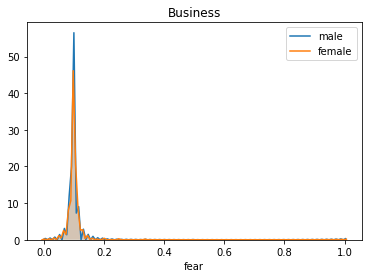

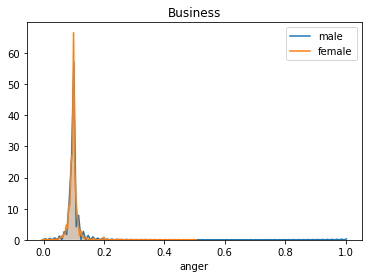

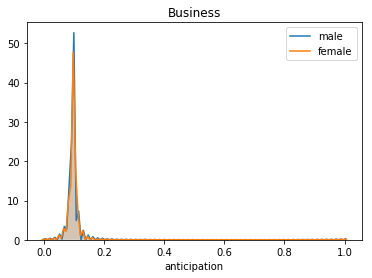

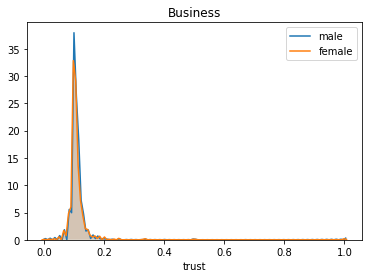

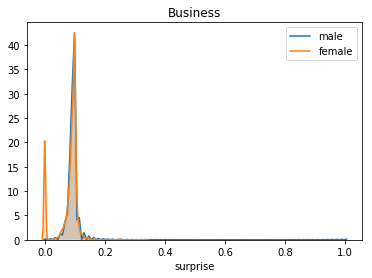

...

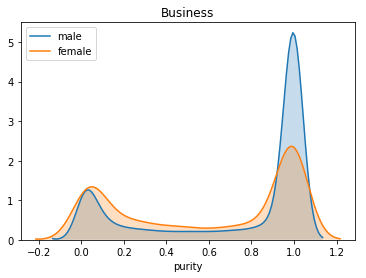

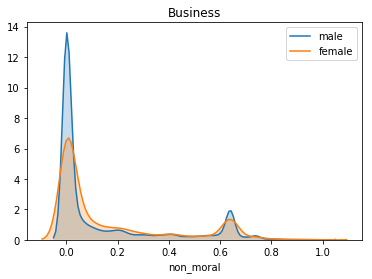

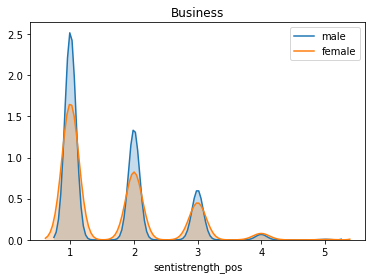

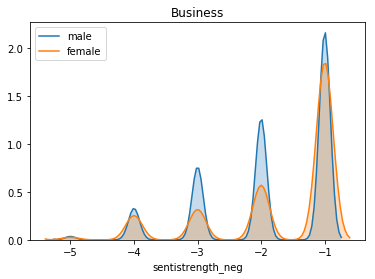

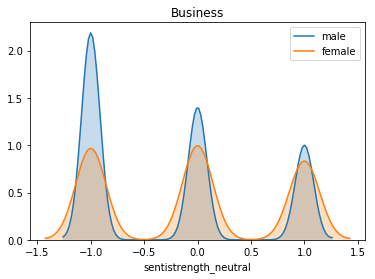

entrepreneur


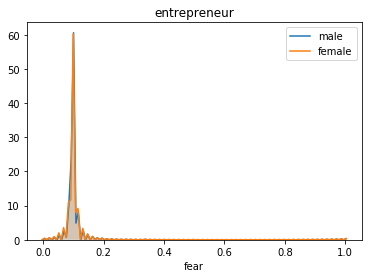

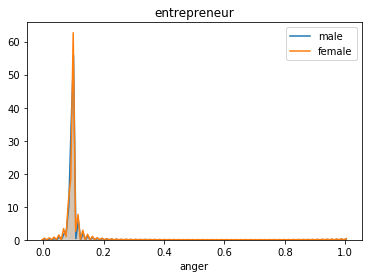

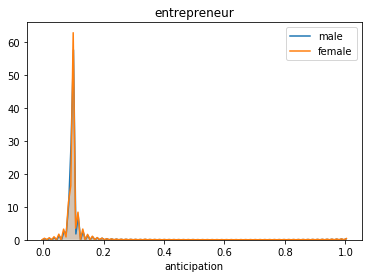

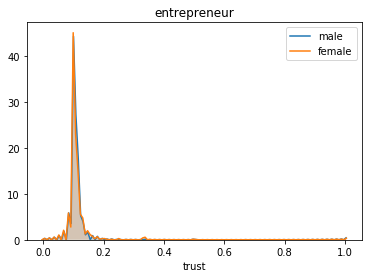

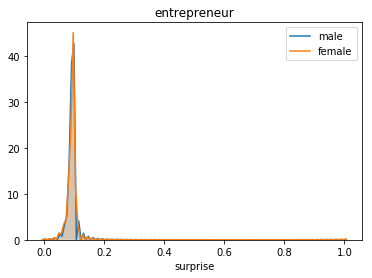

...

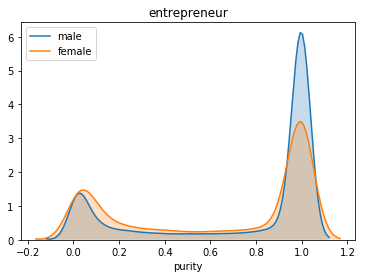

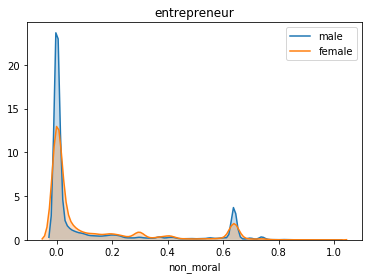

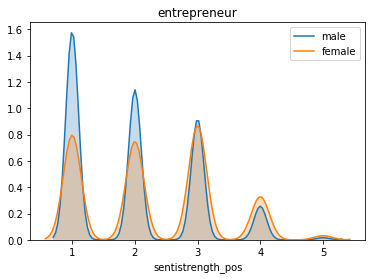

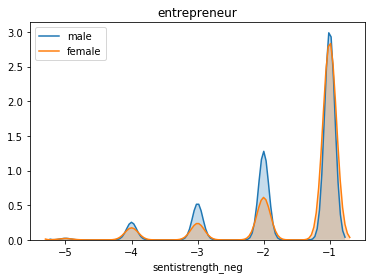

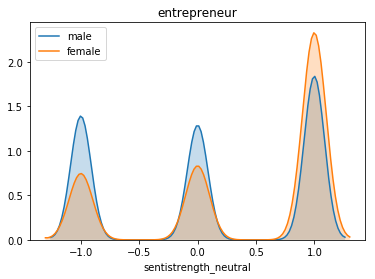

EntrepreneurRideAlong


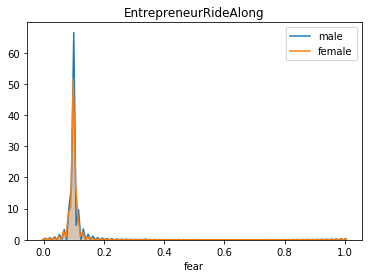

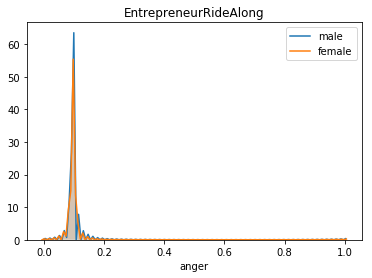

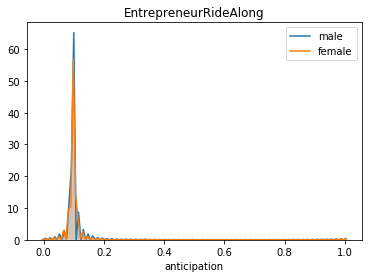

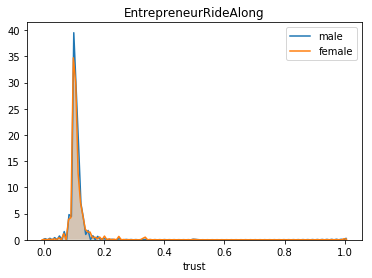

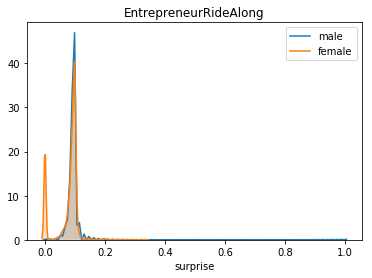

...

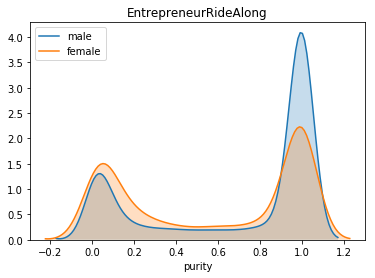

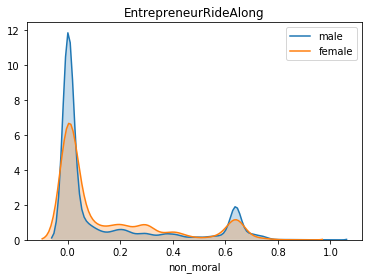

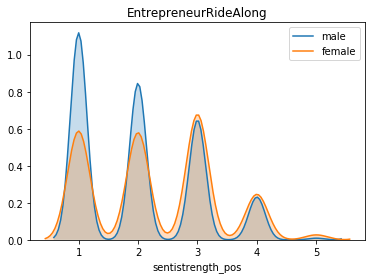

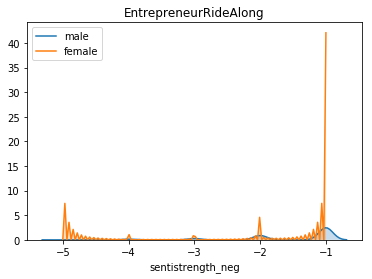

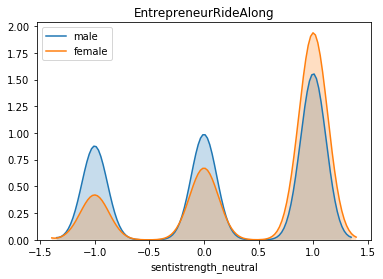

Entrepreneurship


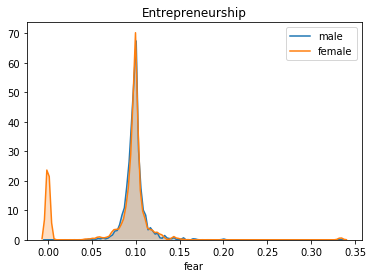

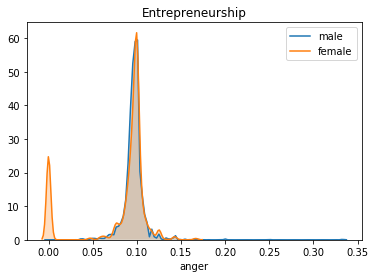

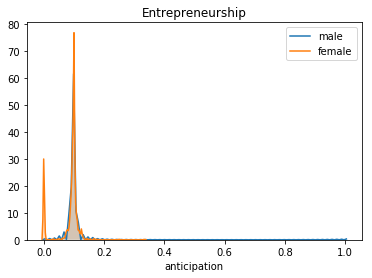

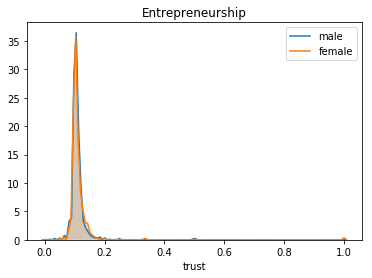

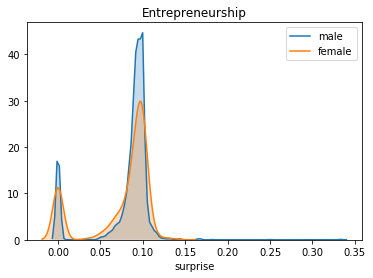

...

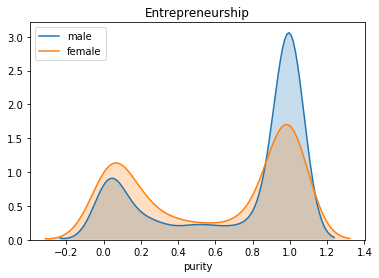

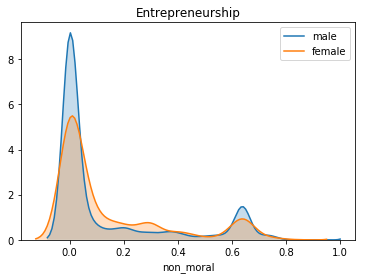

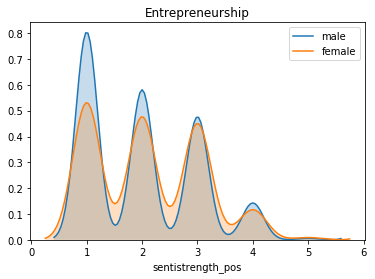

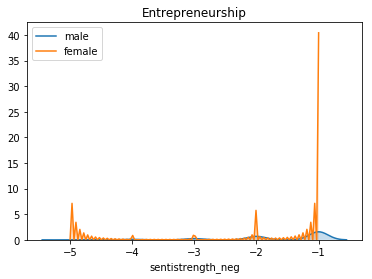

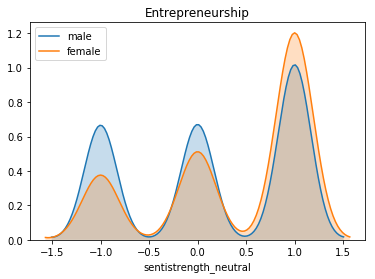

Growmybusiness


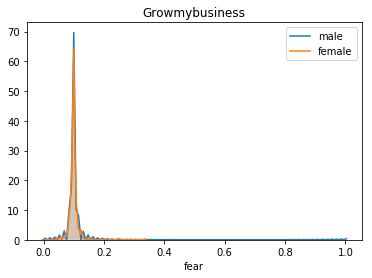

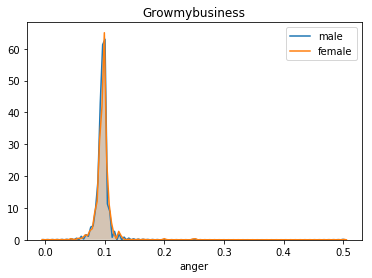

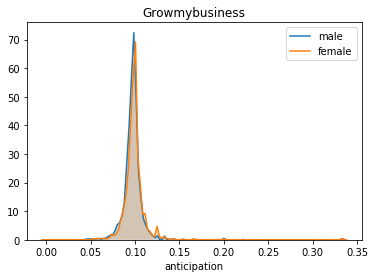

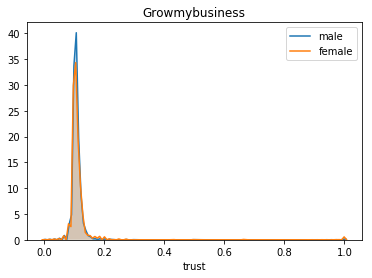

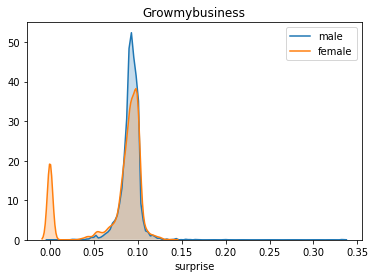

...

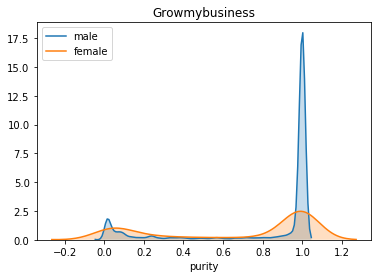

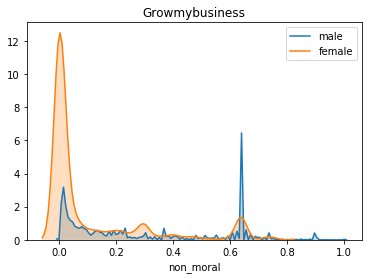

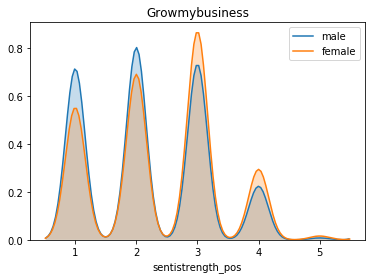

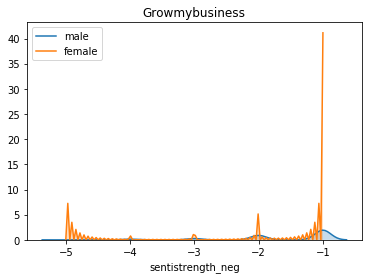

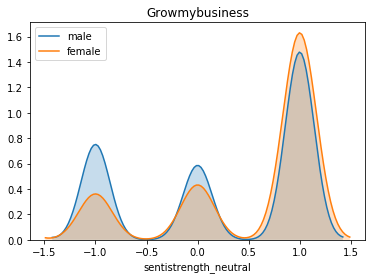

Ladybusiness


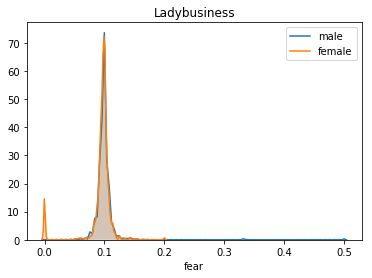

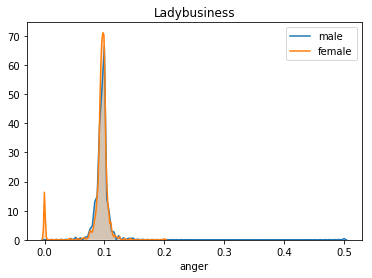

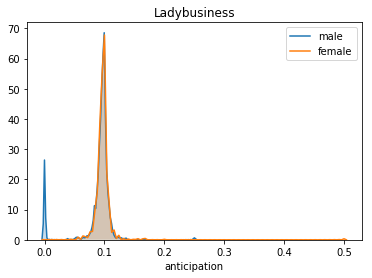

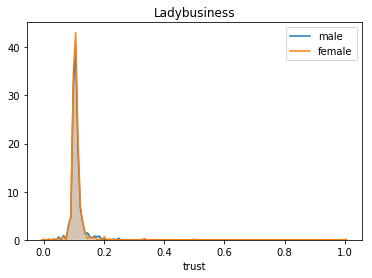

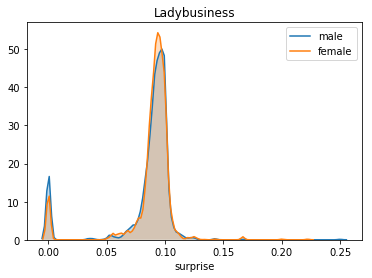

...

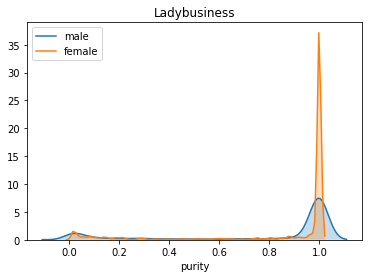

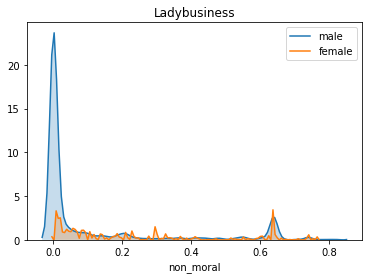

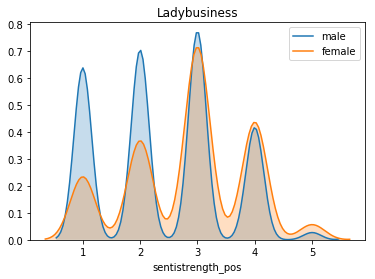

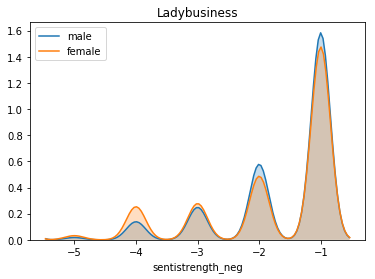

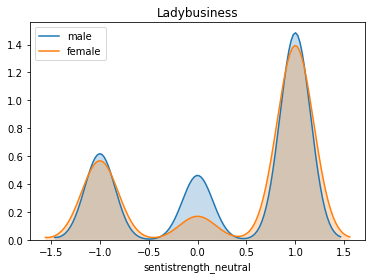

Smallbusiness


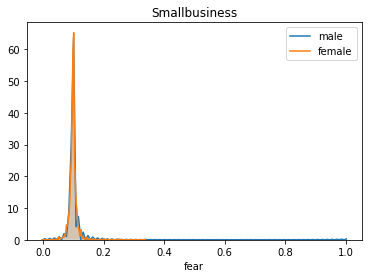

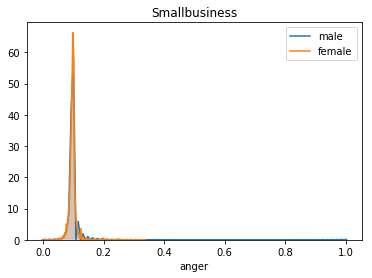

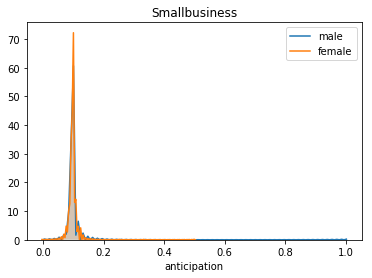

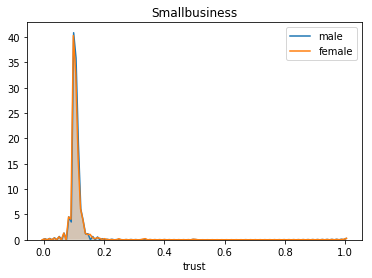

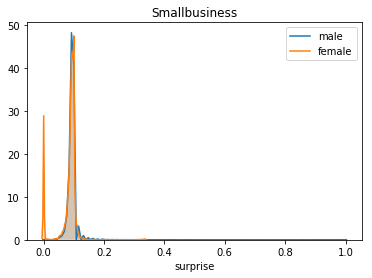

...

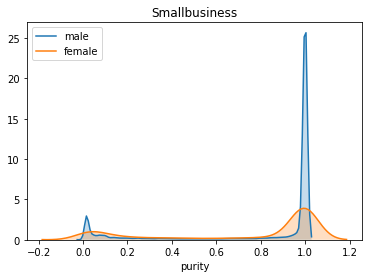

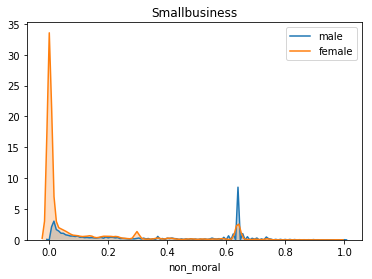

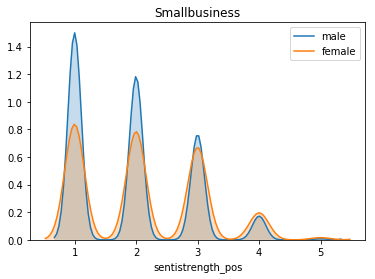

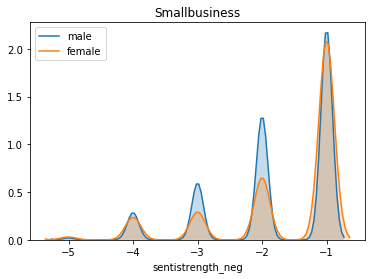

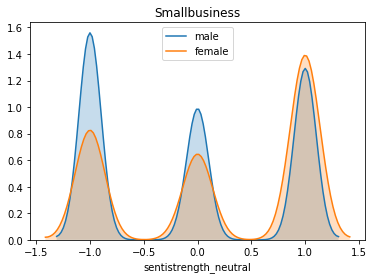

Startup_ideas


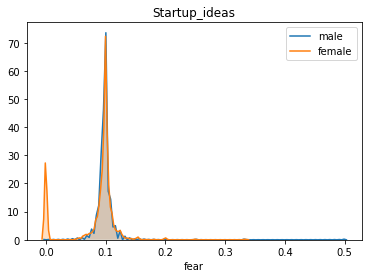

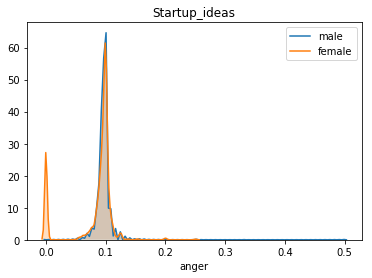

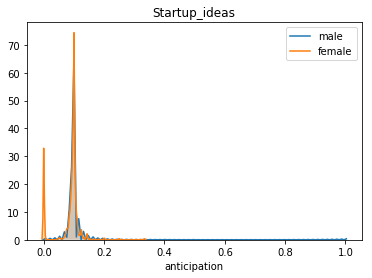

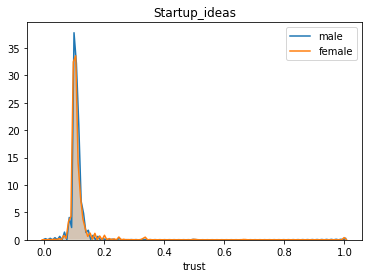

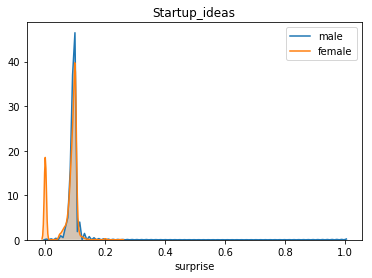

...

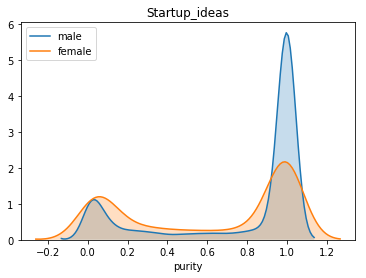

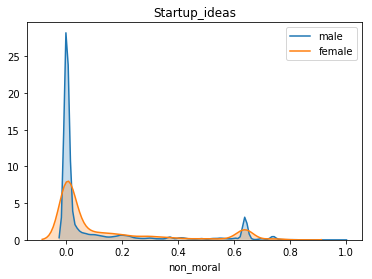

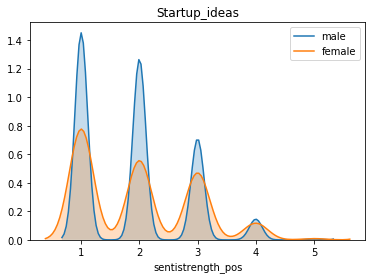

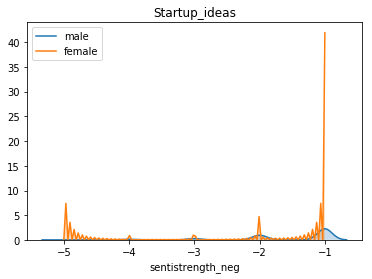

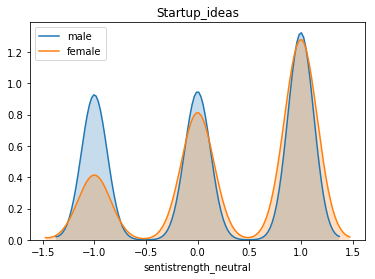

Startups


/Users/prady/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:2901: DtypeWarning: Columns (3,4,7,8,12,13,18,19,20,23,24,36,44,47,50,53,57,67) have mixed types. Specify dtype option on import or set low_memory=False.
  if self.run_code(code, result):


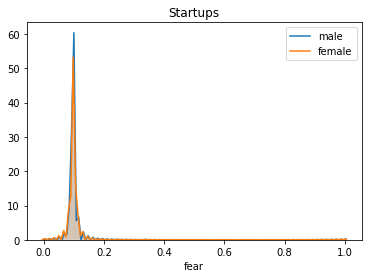

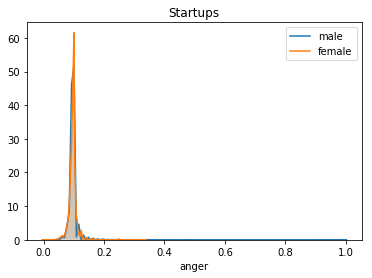

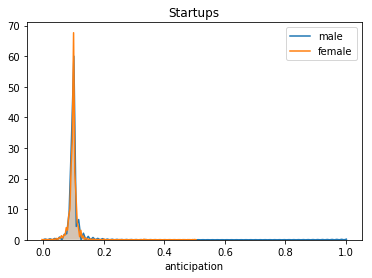

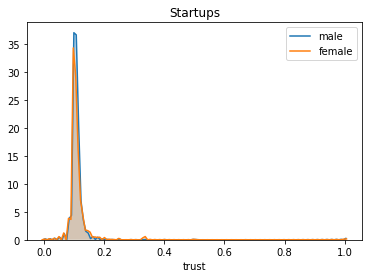

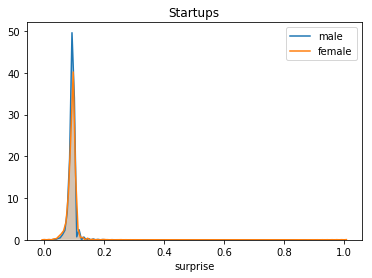

...

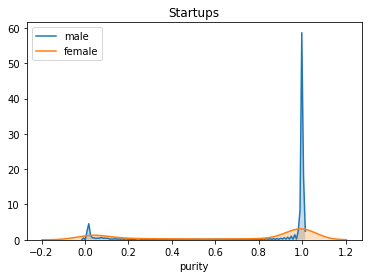

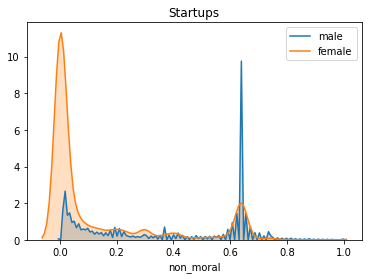

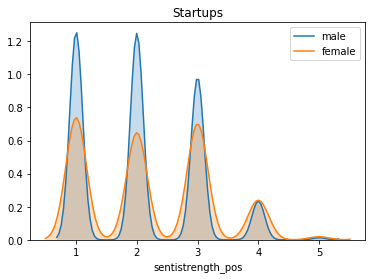

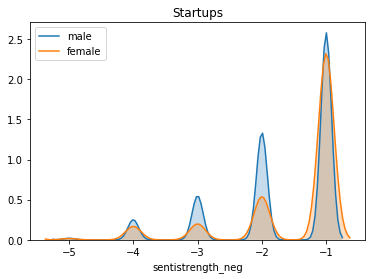

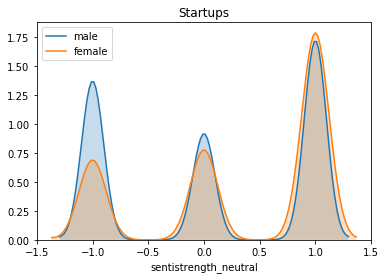

Venturecapital


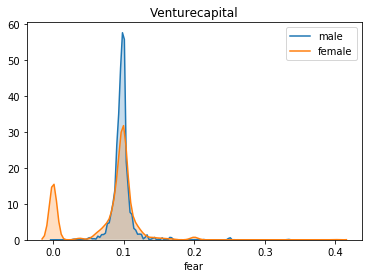

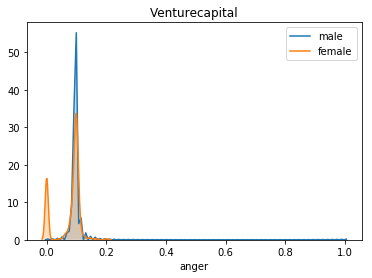

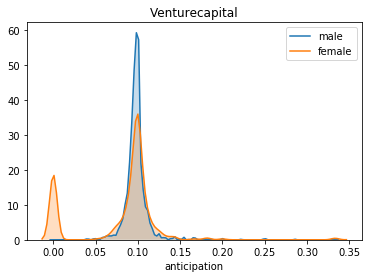

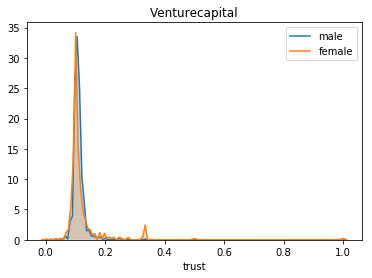

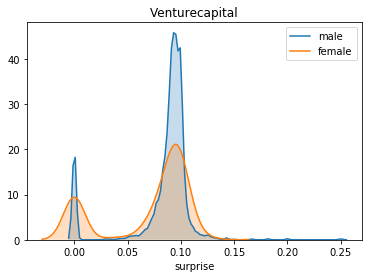

...

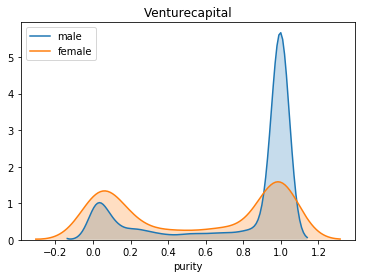

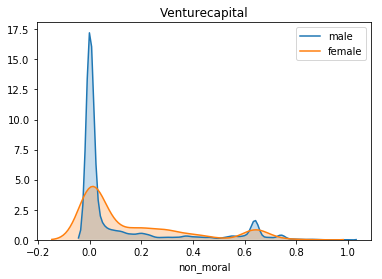

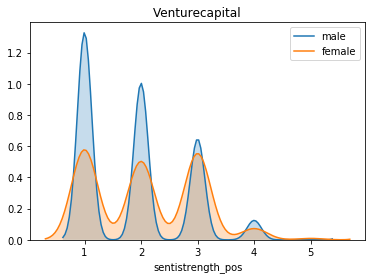

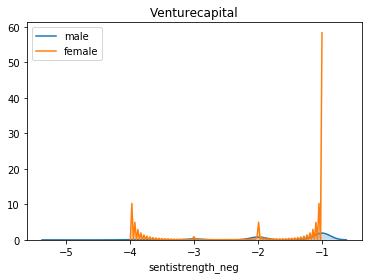

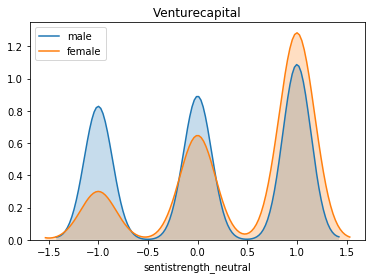

Business


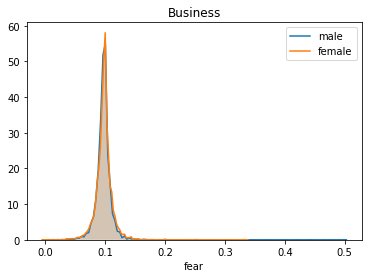

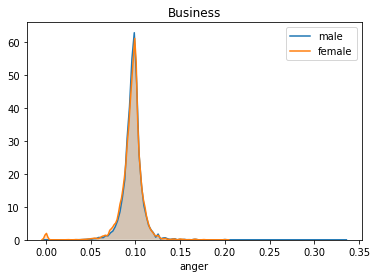

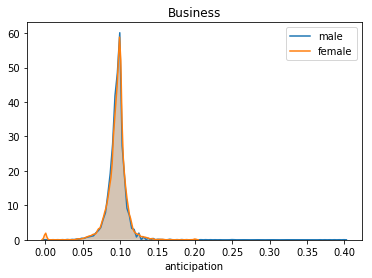

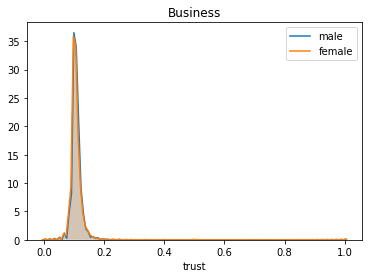

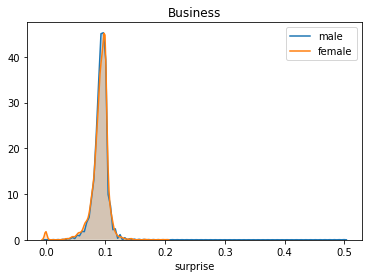

...

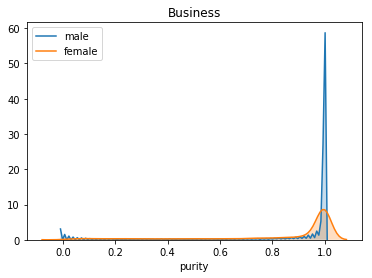

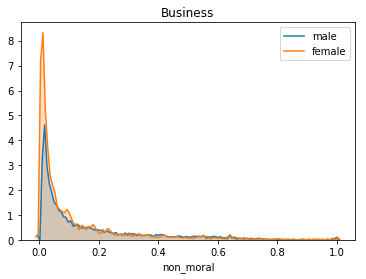

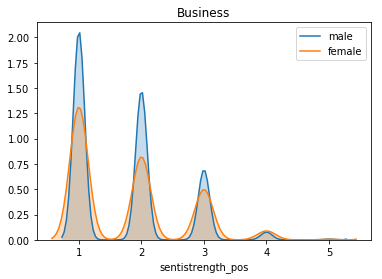

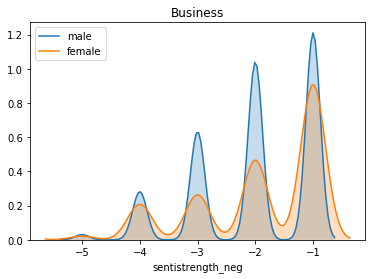

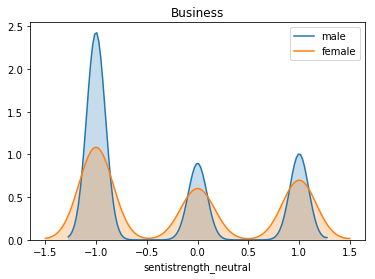

entrepreneur


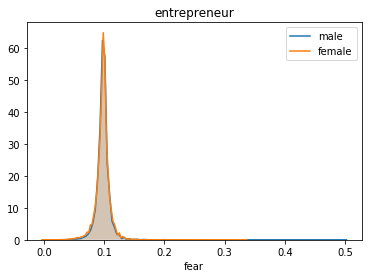

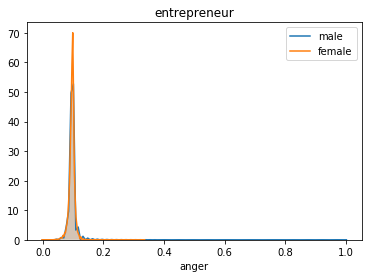

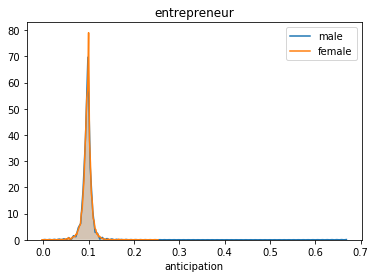

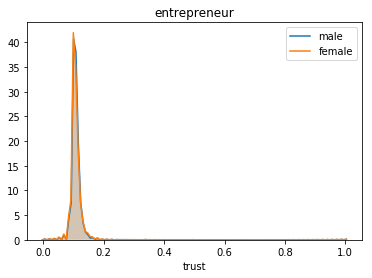

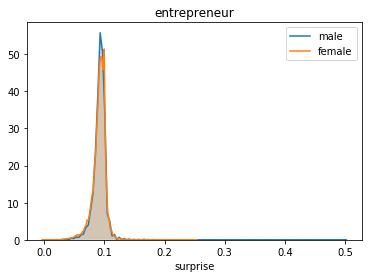

...

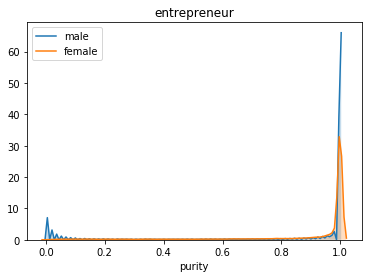

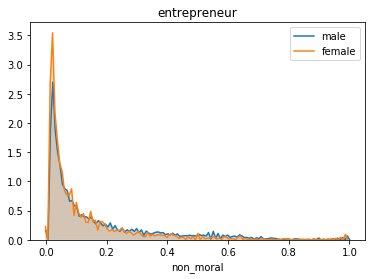

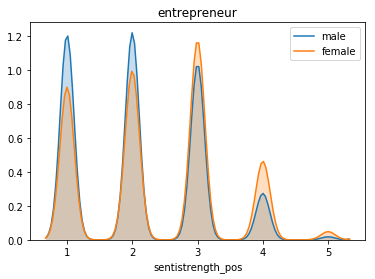

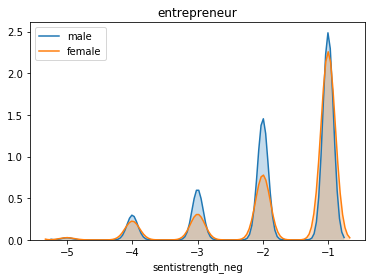

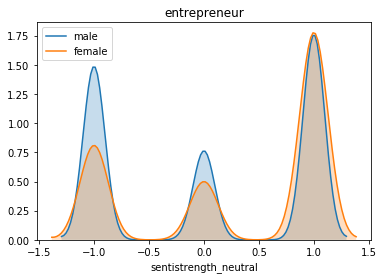

EntrepreneurRideAlong


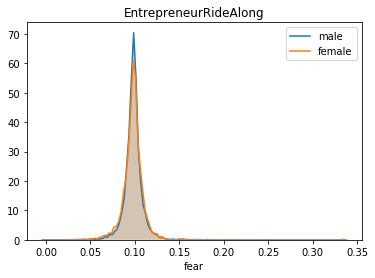

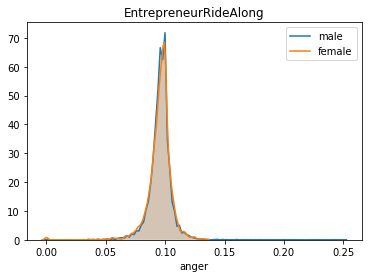

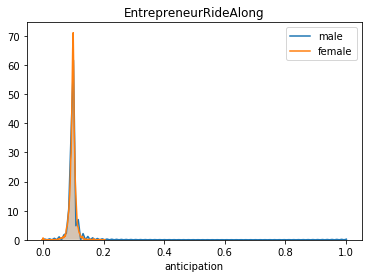

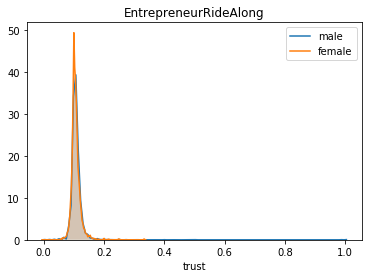

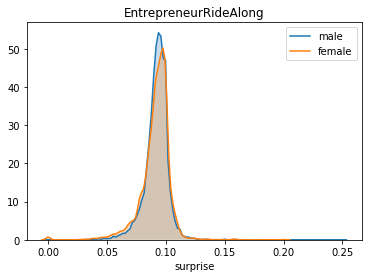

...

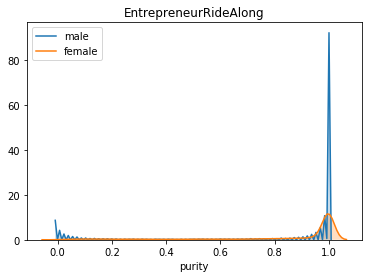

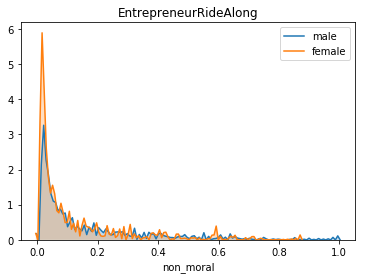

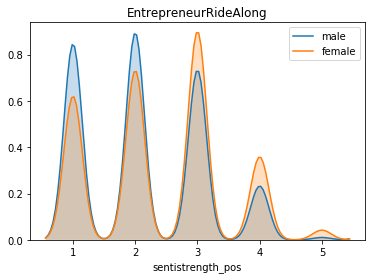

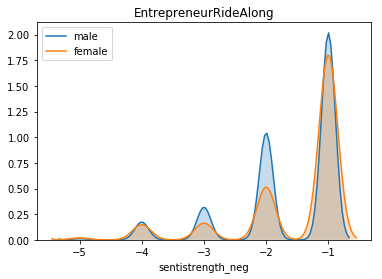

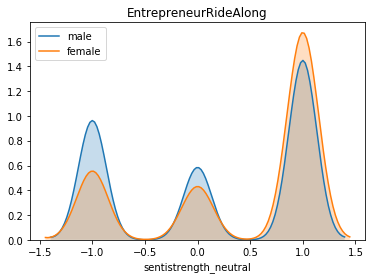

Entrepreneurship


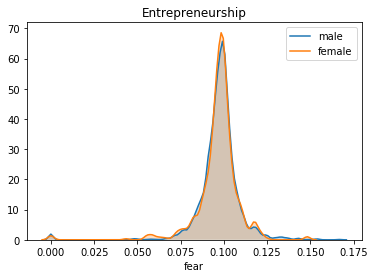

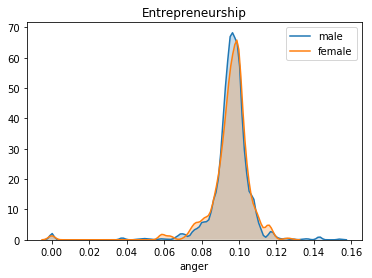

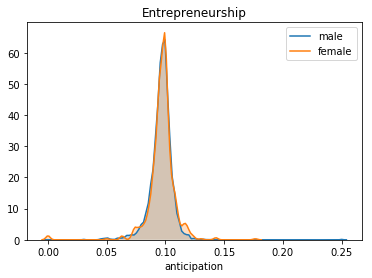

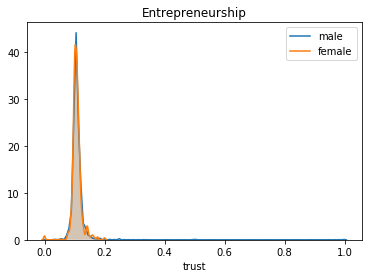

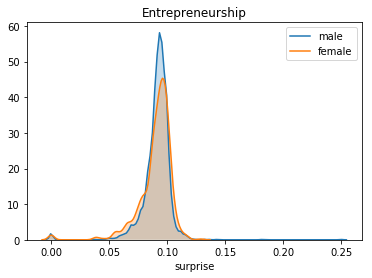

...

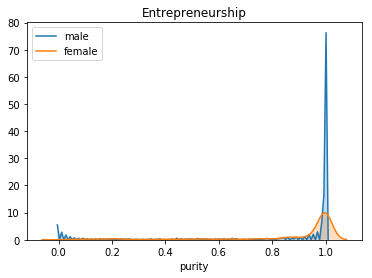

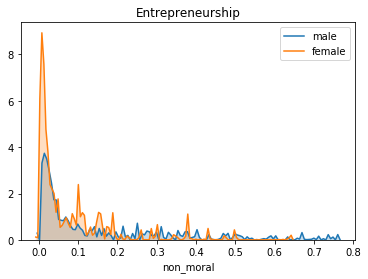

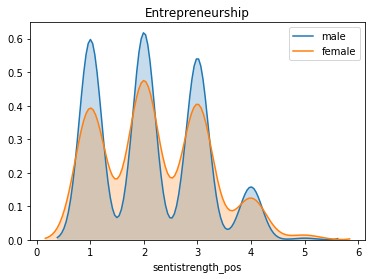

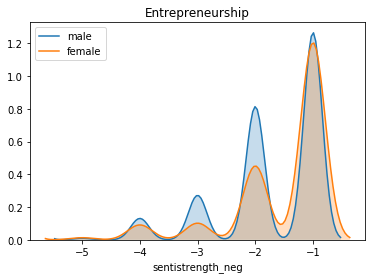

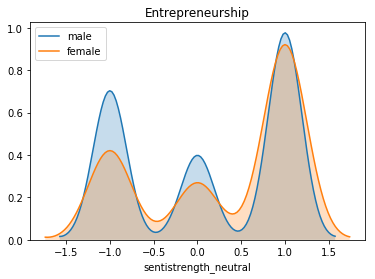

Growmybusiness


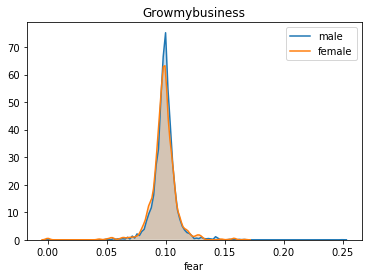

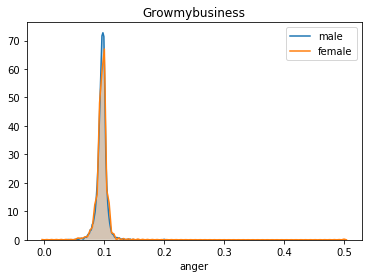

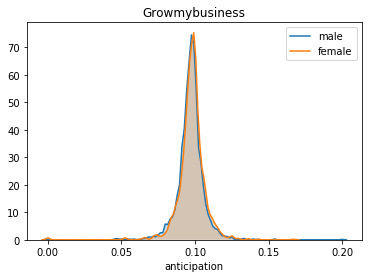

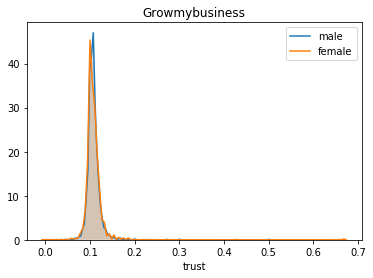

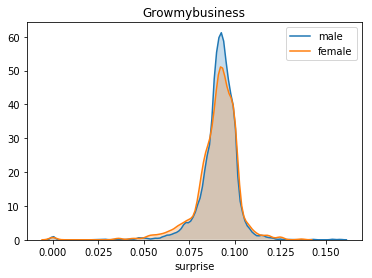

...

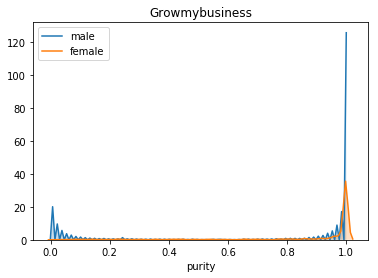

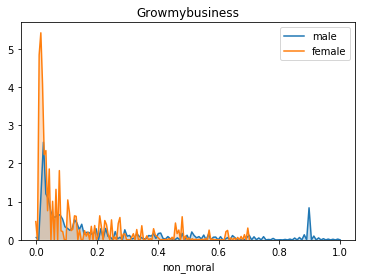

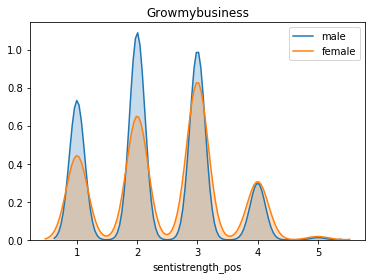

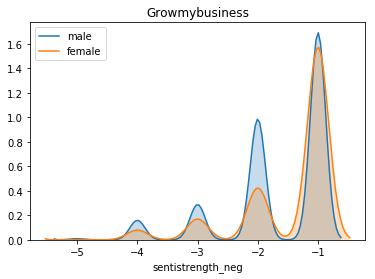

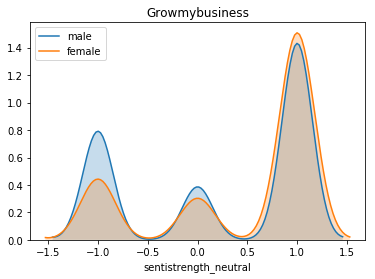

Ladybusiness


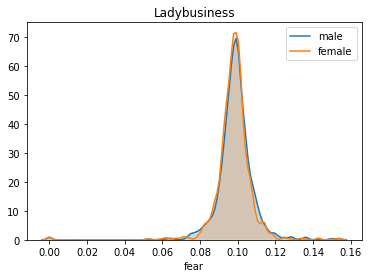

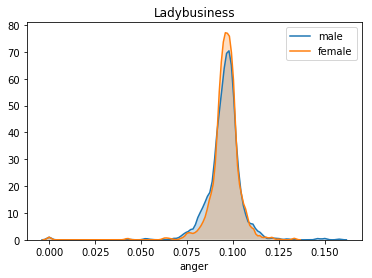

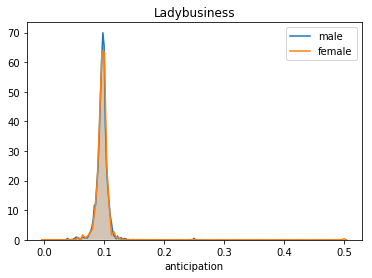

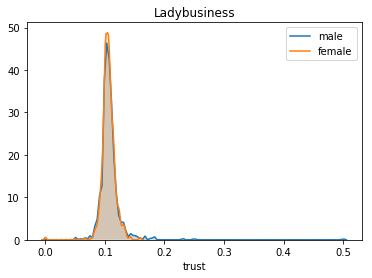

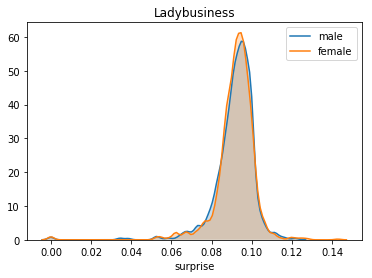

...

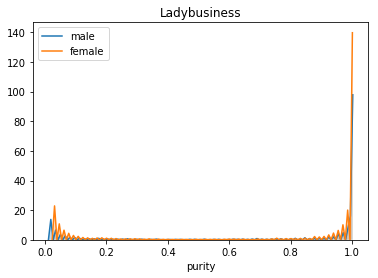

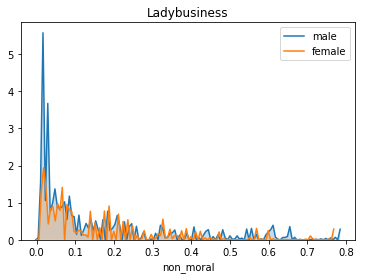

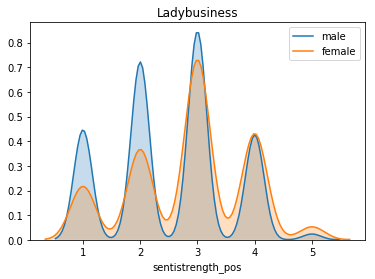

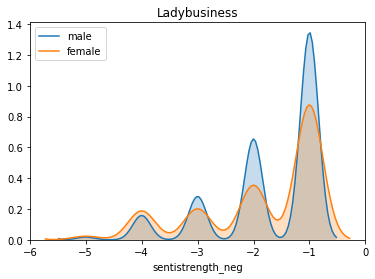

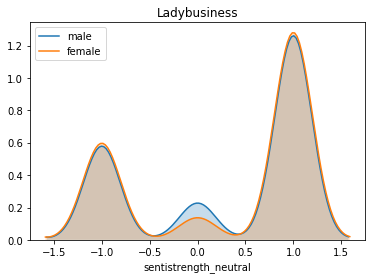

Smallbusiness


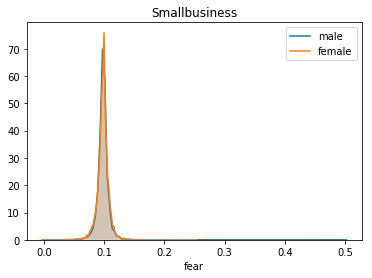

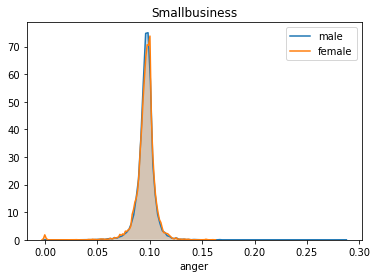

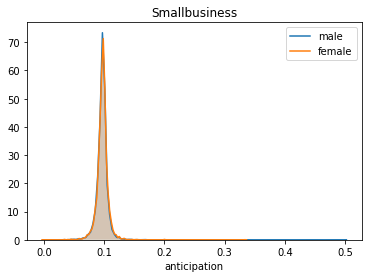

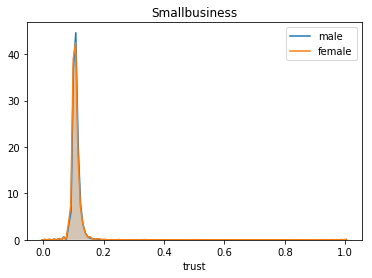

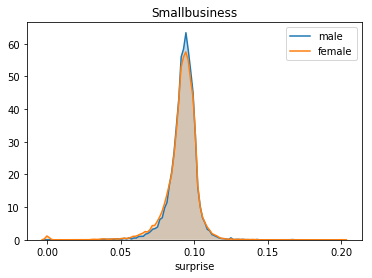

...

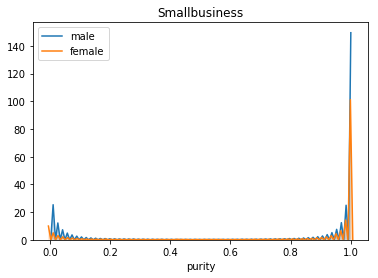

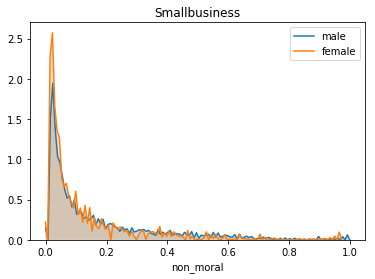

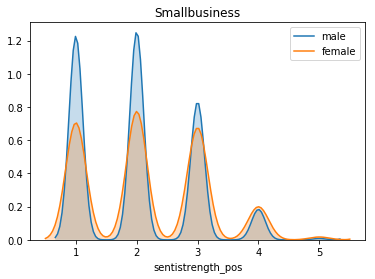

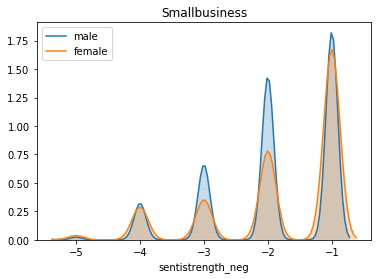

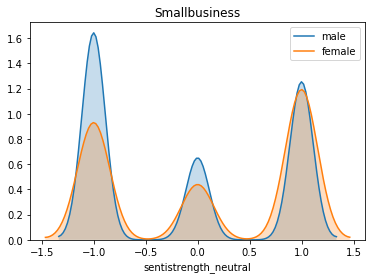

Startup_ideas


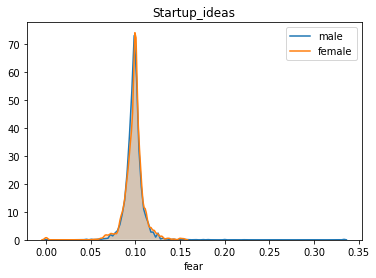

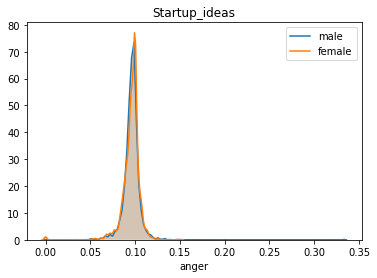

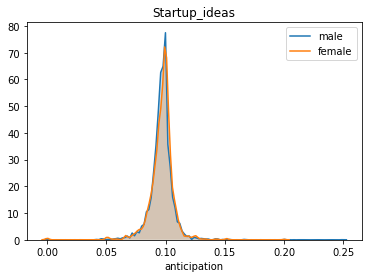

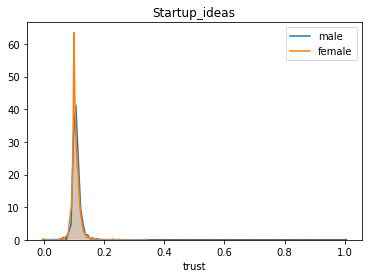

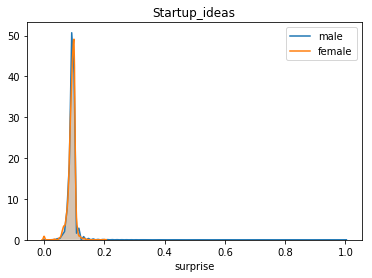

...

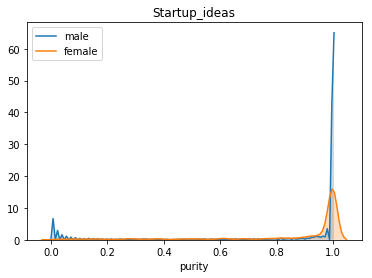

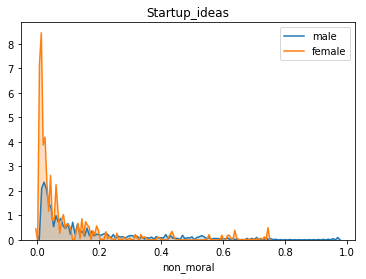

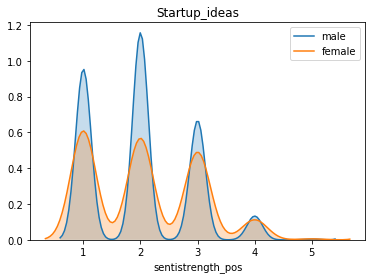

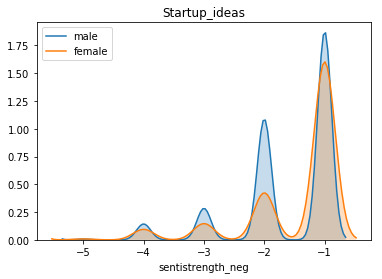

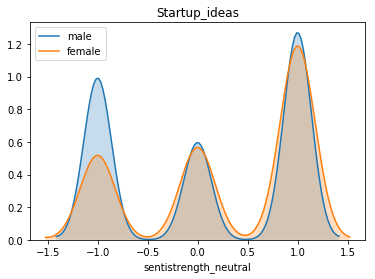

Startups


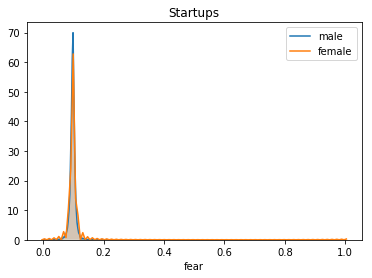

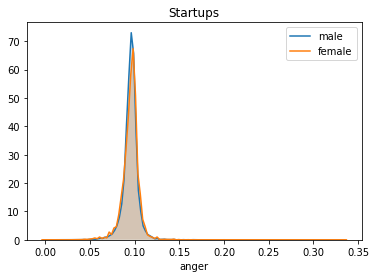

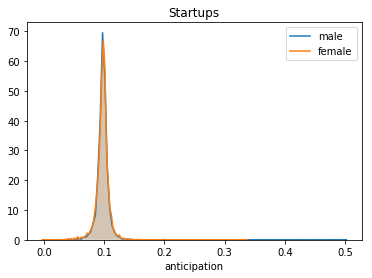

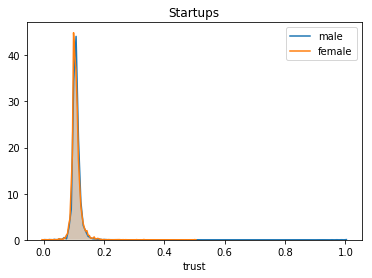

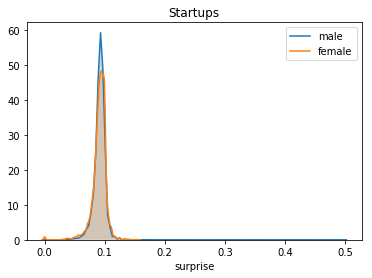

...

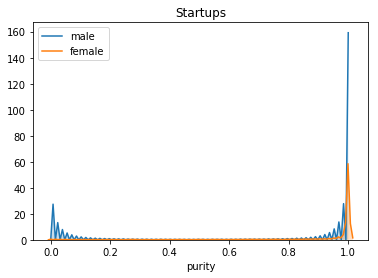

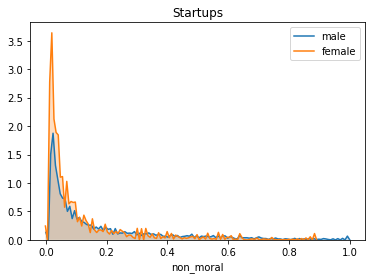

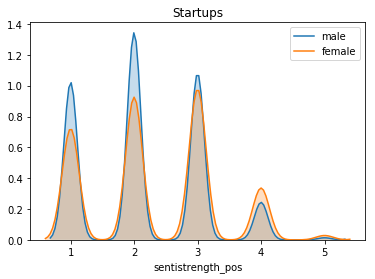

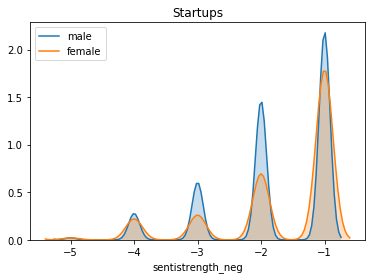

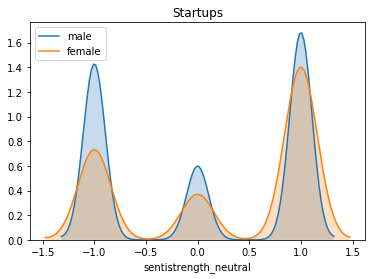

Venturecapital


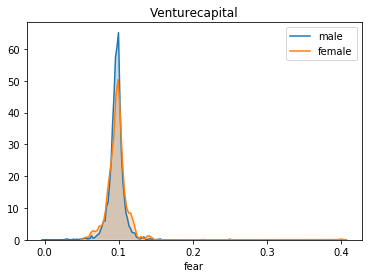

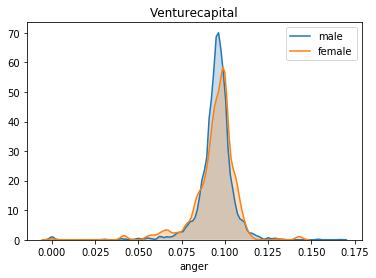

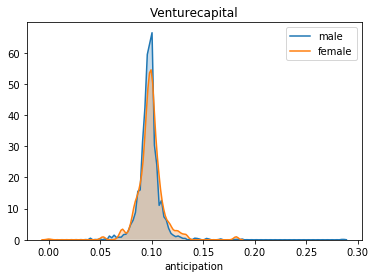

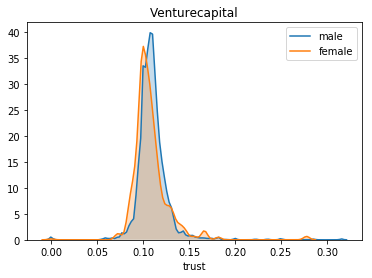

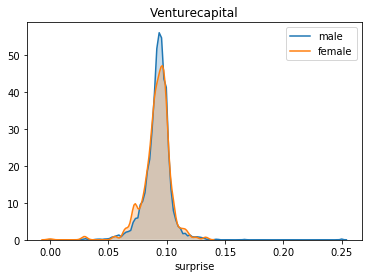

...

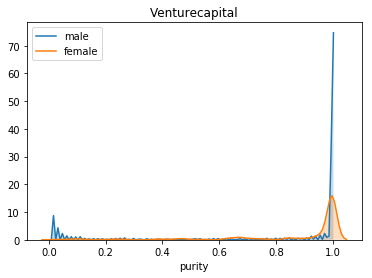

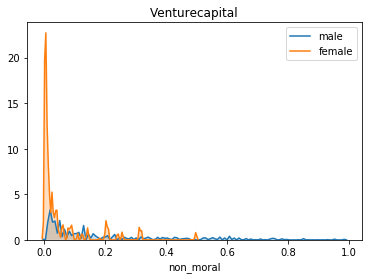

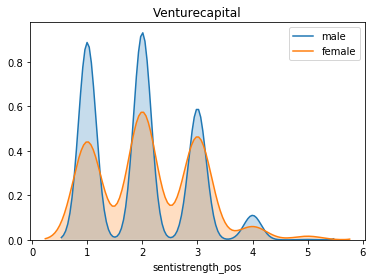

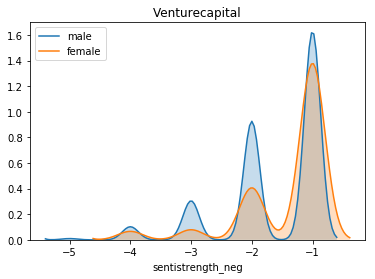

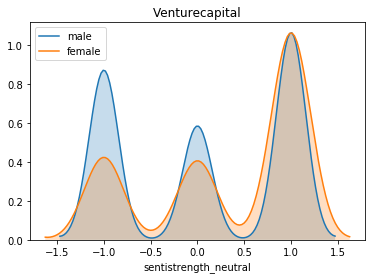

Business


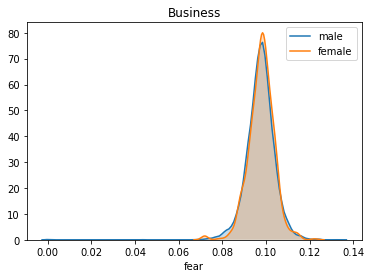

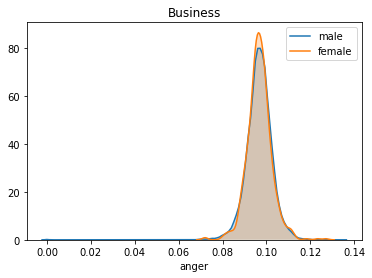

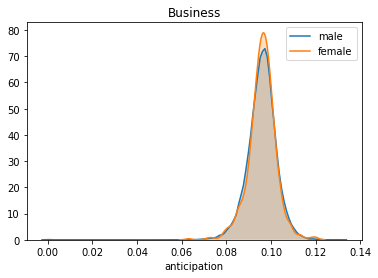

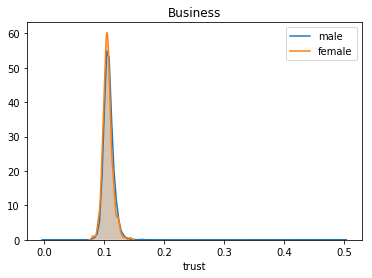

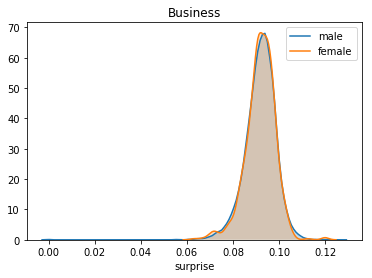

...

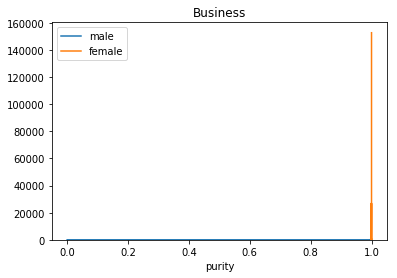

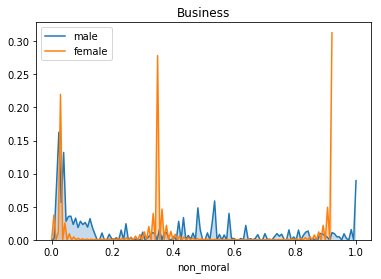

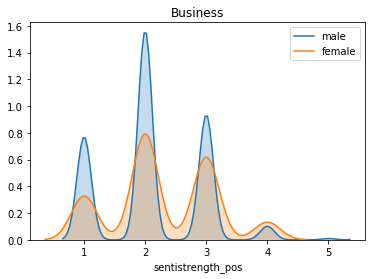

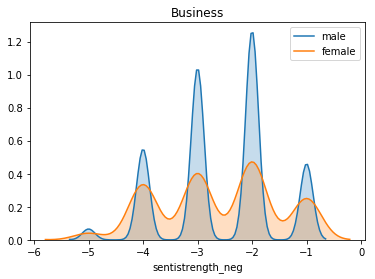

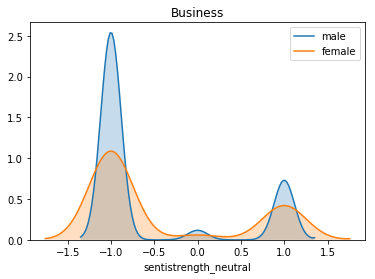

entrepreneur


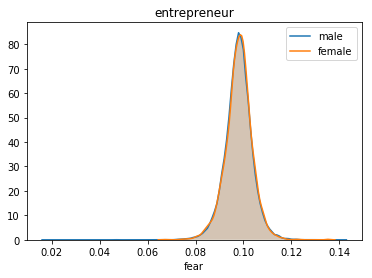

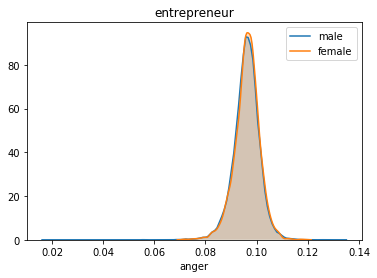

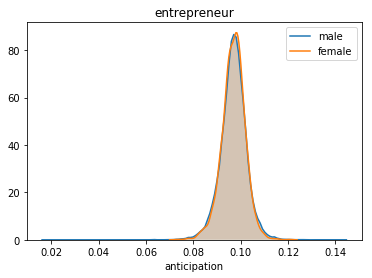

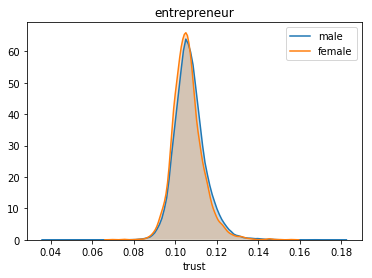

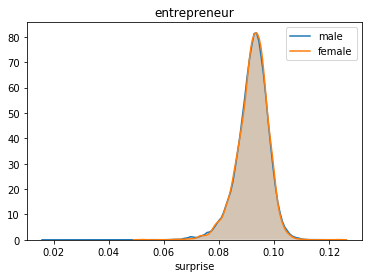

...

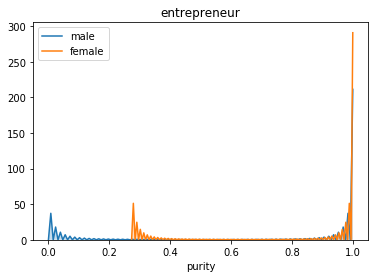

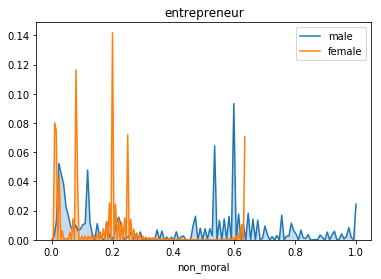

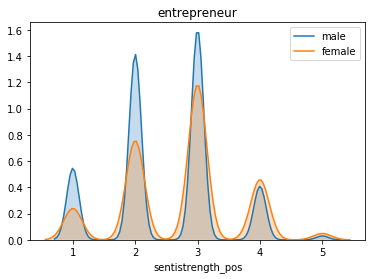

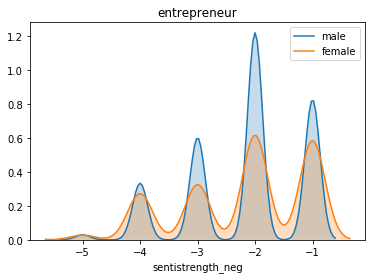

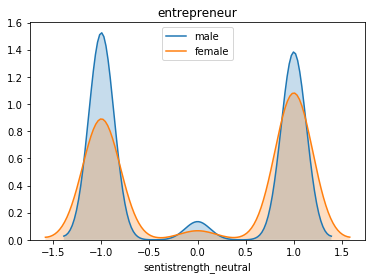

EntrepreneurRideAlong


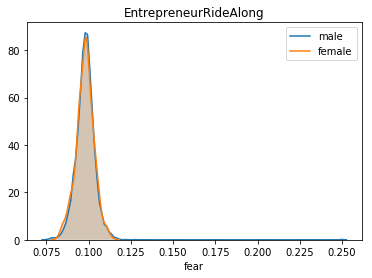

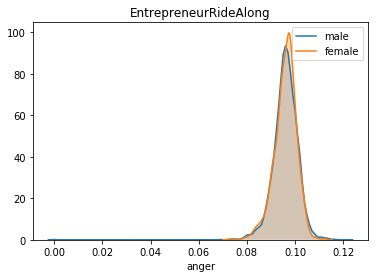

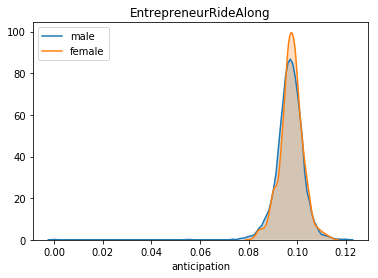

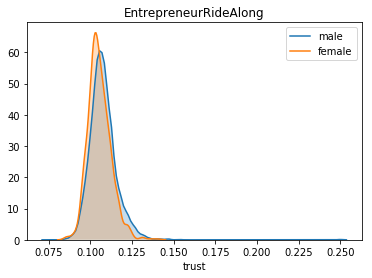

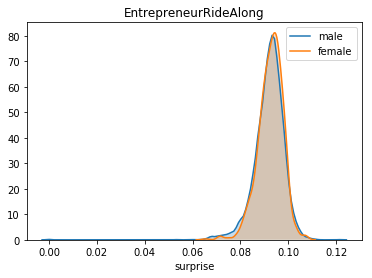

...

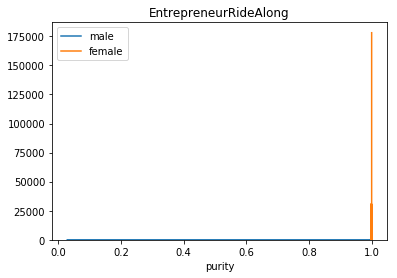

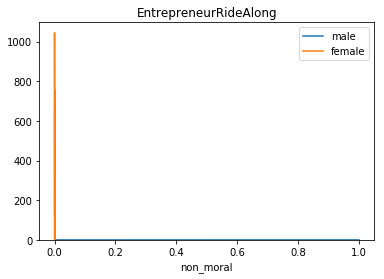

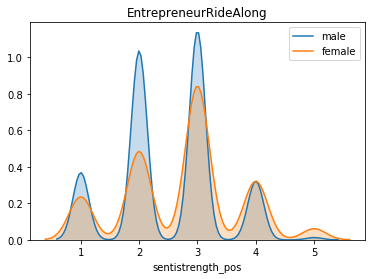

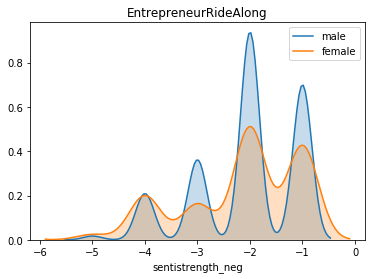

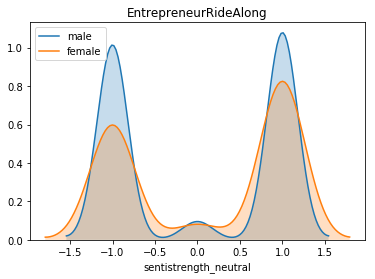

Entrepreneurship


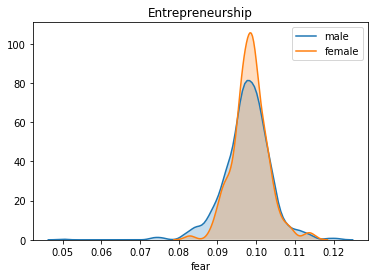

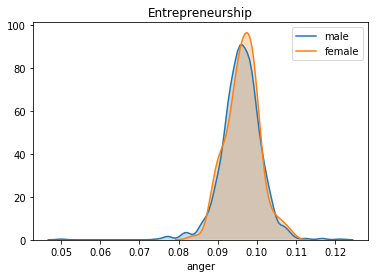

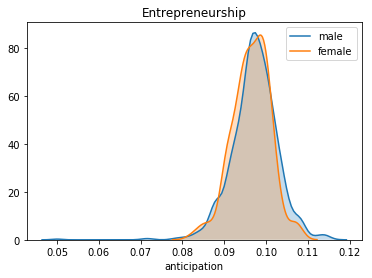

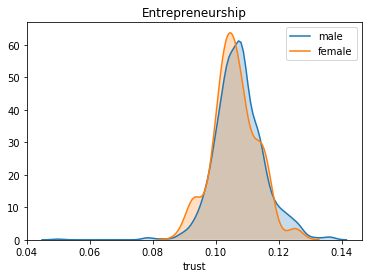

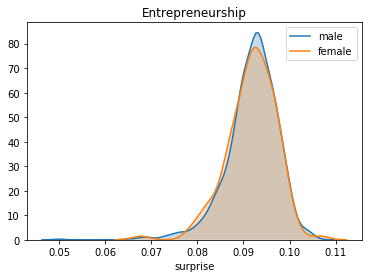

...

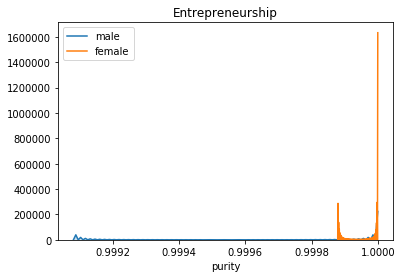

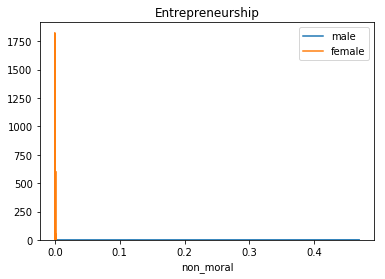

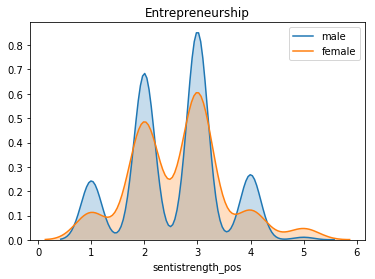

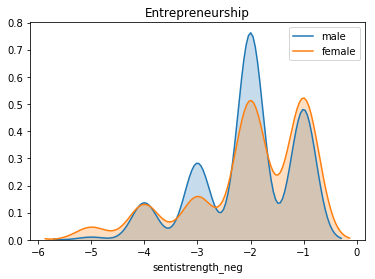

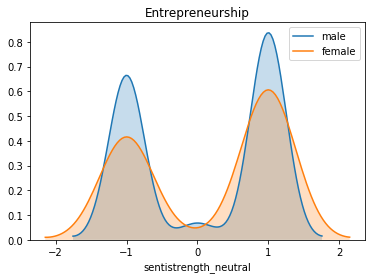

Growmybusiness


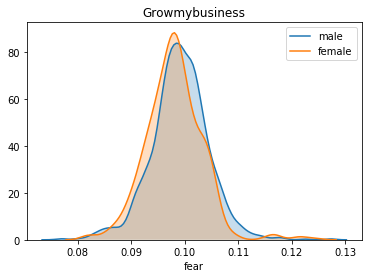

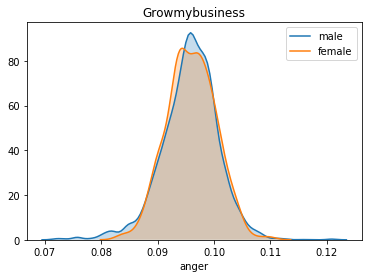

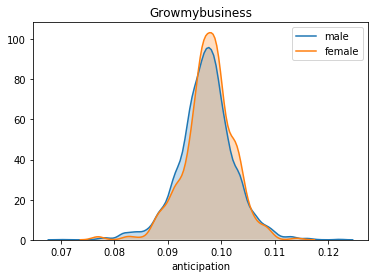

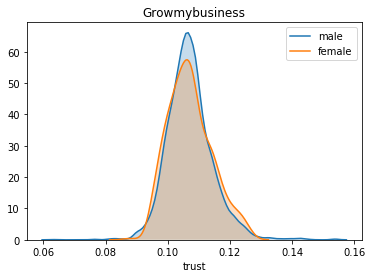

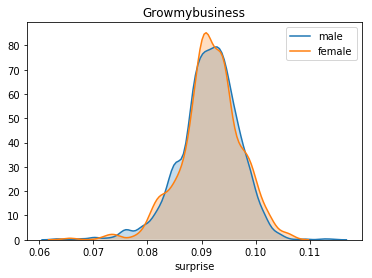

...

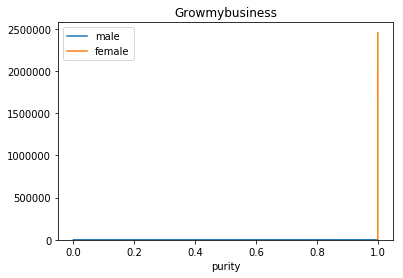

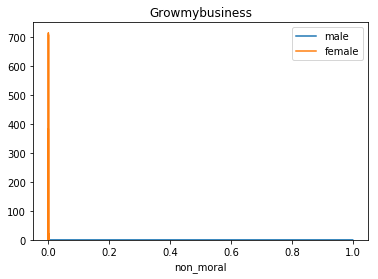

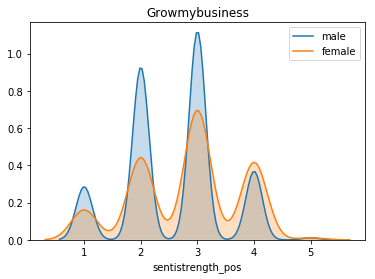

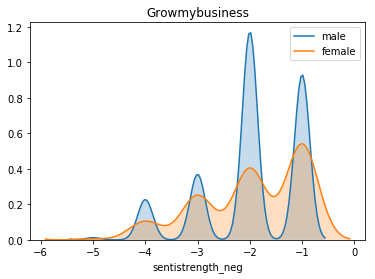

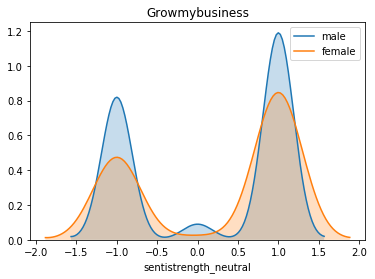

Ladybusiness


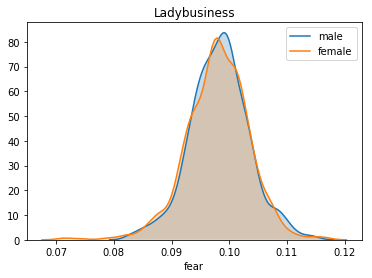

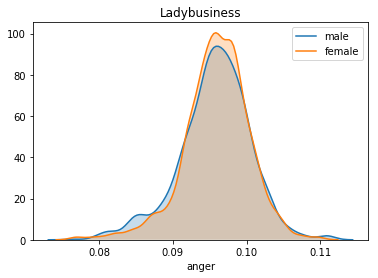

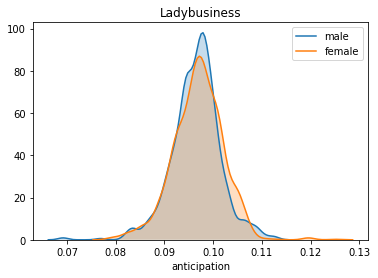

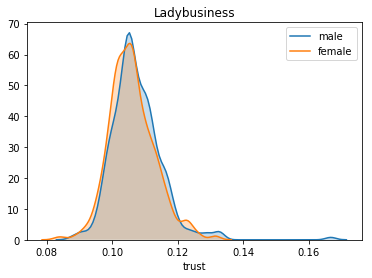

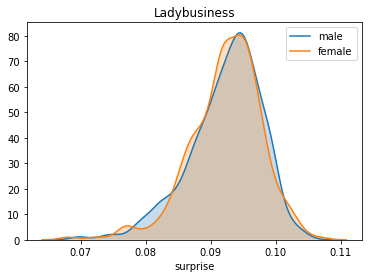

...

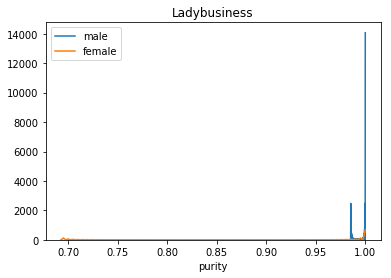

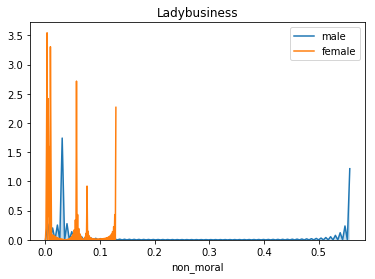

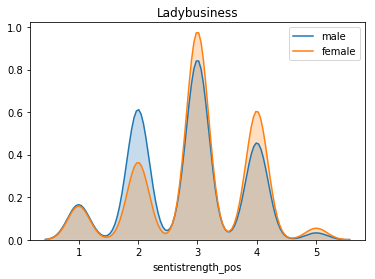

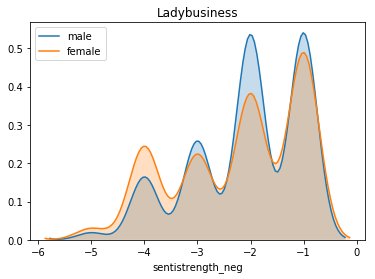

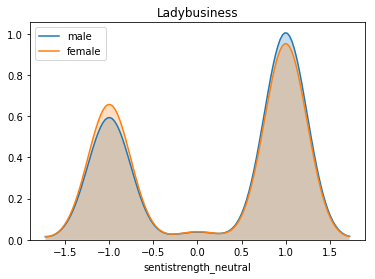

Smallbusiness


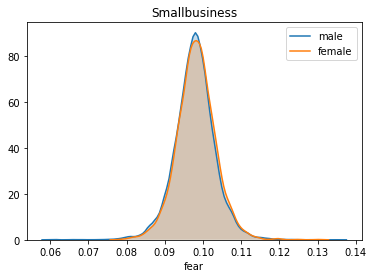

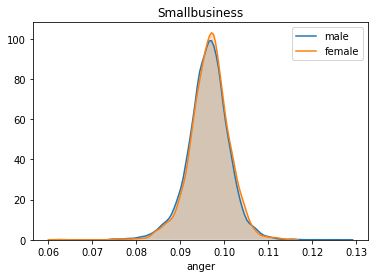

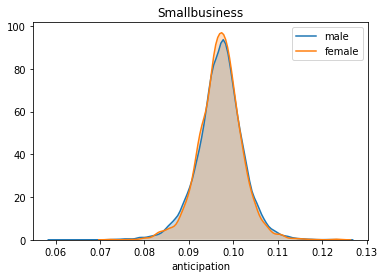

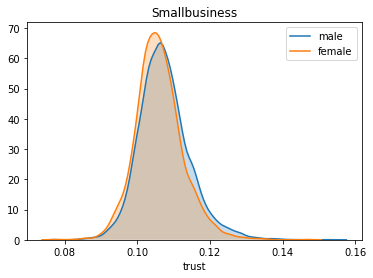

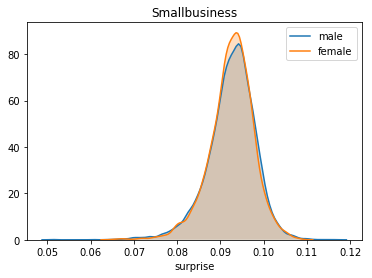

...

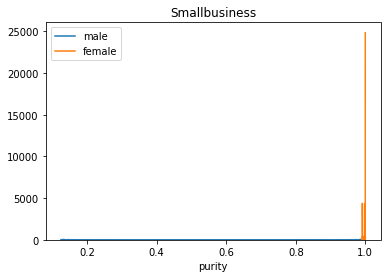

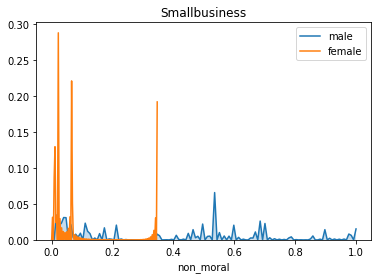

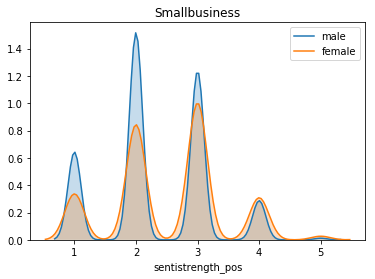

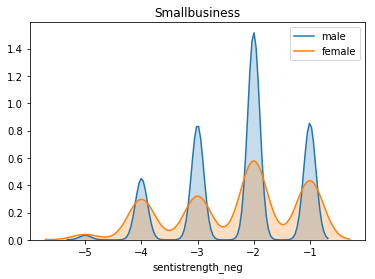

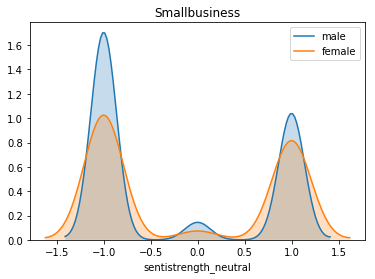

Startup_ideas


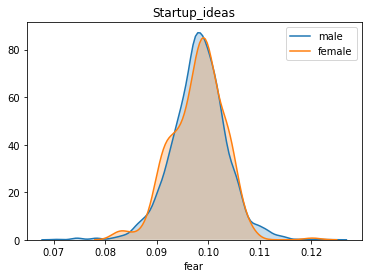

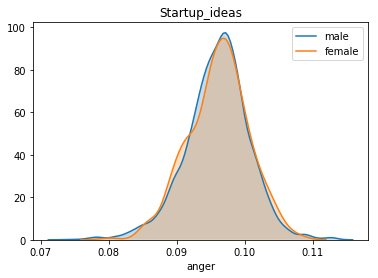

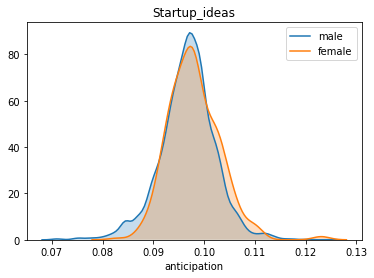

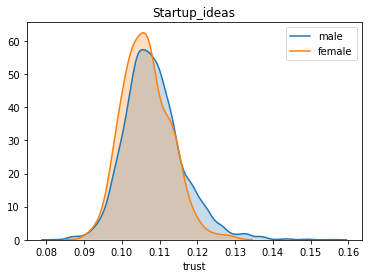

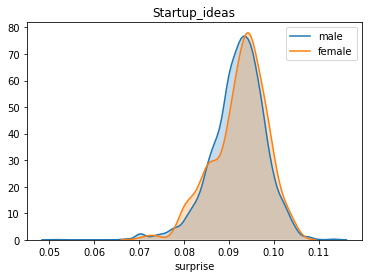

...

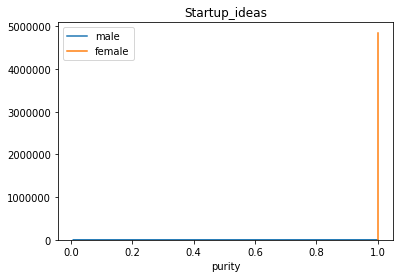

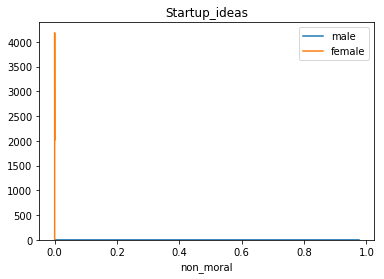

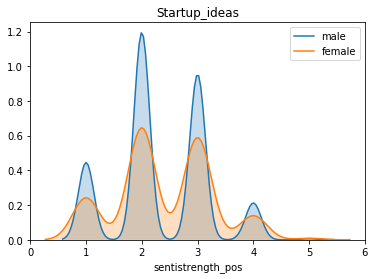

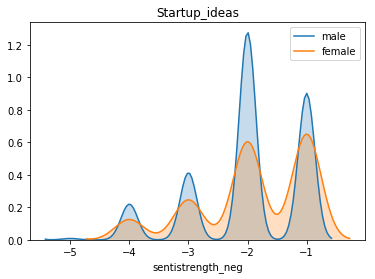

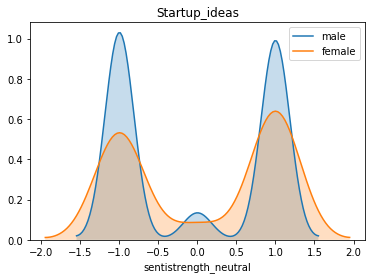

Startups


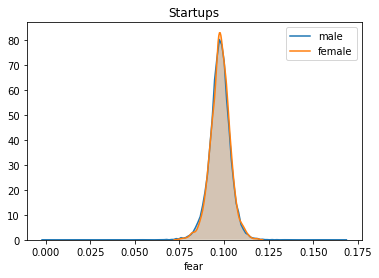

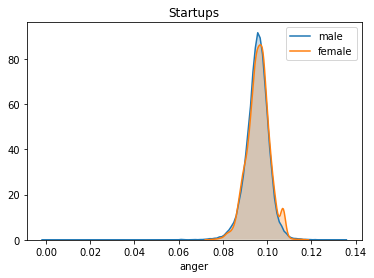

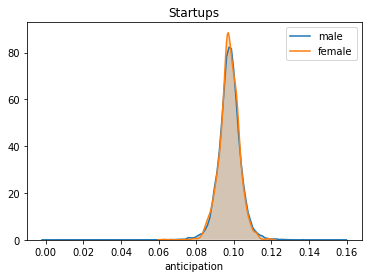

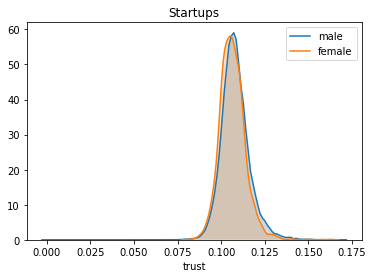

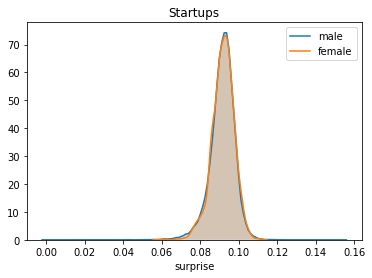

...

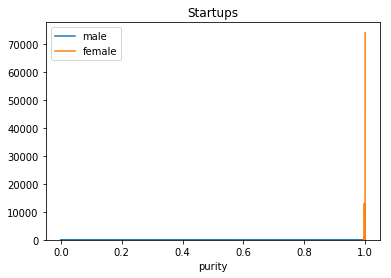

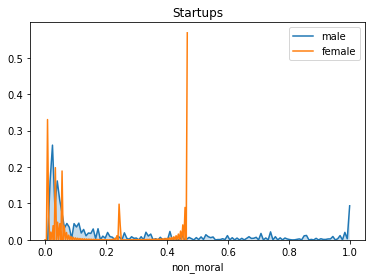

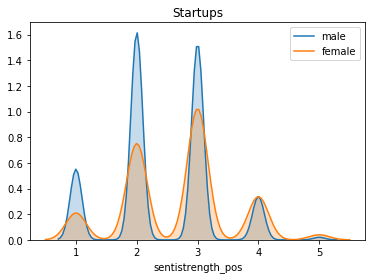

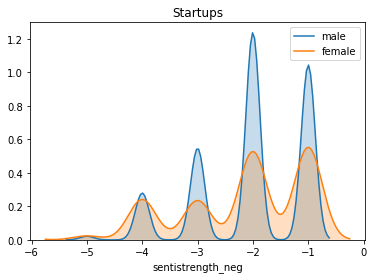

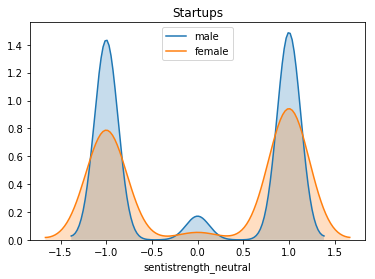

Venturecapital


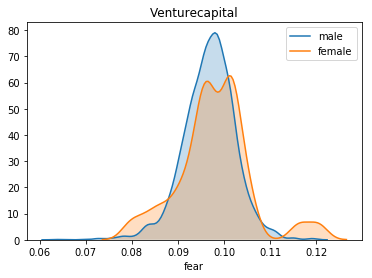

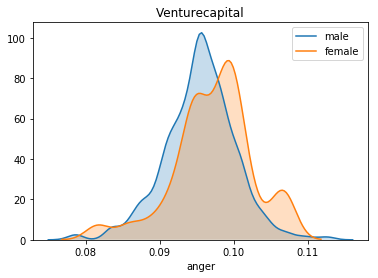

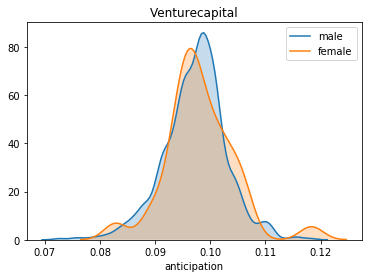

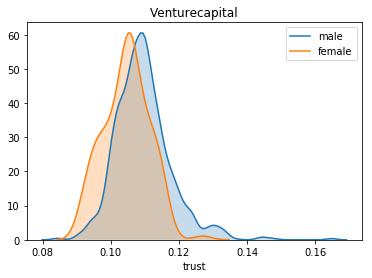

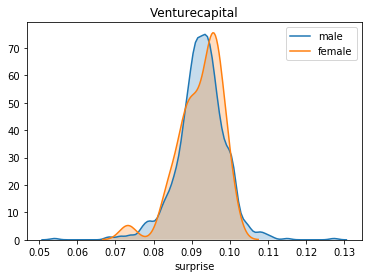

...

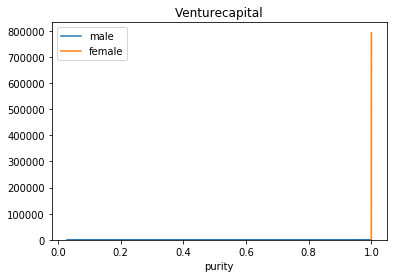

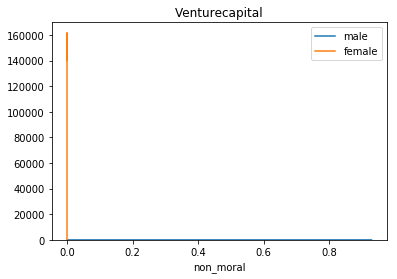

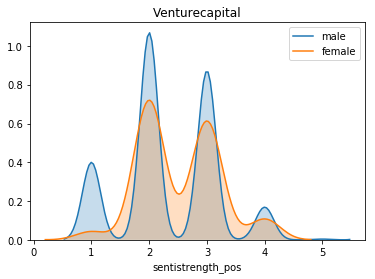

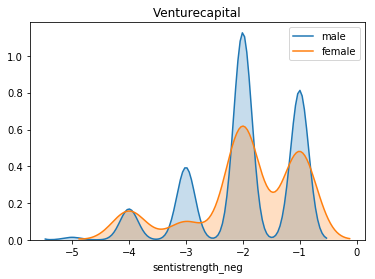

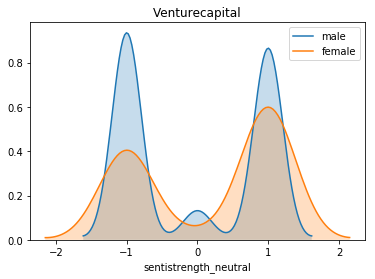

In [19]:
reddit_dir = '../../rawdata/'
reddit_list = [y for x in os.walk(reddit_dir) for y in glob(os.path.join(x[0], '*.csv')) if 'comment' in y]

subreddit_list = ['Business', 'entrepreneur', 'EntrepreneurRideAlong', 'Entrepreneurship',
                  'Growmybusiness', 'Ladybusiness', 'Smallbusiness', 'Startup_ideas', 'Startups',
                  'Venturecapital']
# subreddit_list = ['Venturecapital']
col_list = ['fear', 'anger',
   'anticipation', 'trust', 'surprise', 'positive', 'negative', 'sadness',
   'disgust', 'joy', 'care', 'fairness', 'loyalty', 'authority', 'purity',
   'non_moral','sentistrength_pos','sentistrength_neg','sentistrength_neutral']
# col_list = ['sentistrength_pos','sentistrength_neg','sentistrength_neutral']
wc_threshold_list = [0,10,50]
for wc_threshold in wc_threshold_list:
    for sl in subreddit_list:
        print(sl)
        slist = [r for r in reddit_list if sl in r]
        df_reddit = pd.DataFrame()
        for s in slist:
            df = load_reddit(s)
            df = df[col_list + ['predicted_gender', 'textblob_wordcount']]
            df_reddit = pd.concat([df_reddit, df], ignore_index=True)
        for c in col_list:
#             plot_cdf(df_reddit, c, transform, wc_threshold=wc_threshold, title=sl)
            plot_dist(df_reddit, c, transform, hist=False, wc_threshold=wc_threshold, title=sl, save=True)

In [1]:
# sl = 'Ladybusiness'
# slist = [r for r in reddit_list if sl in r]
# df_reddit = pd.DataFrame()
# for s in slist:
#     df = load_reddit(s)
#     df = df[col_list + ['predicted_gender', 'textblob_wordcount']]
#     df_reddit = pd.concat([df_reddit, df], ignore_index=True)
# for c in col_list:
#     plot_dist(df_reddit, c, transform, hist=False, wc_threshold=0, title="", save=False)
#     t = stats.ks_2samp(df_reddit.loc[df_reddit['predicted_gender']=='male', c]**0.5,
#                 df_reddit.loc[df_reddit['predicted_gender']=='female', c]**0.5)
#     print(t)